# Violence Detection — Video Swin Transformer (Finetuning)


##  Table of Contents
1. [Setup & Imports](#1)
2. [Dataset Unification](#2)
3. [Data Cleaning & Deduplication](#3)
4. [Exploratory Data Analysis (EDA)](#4)
5. [Video Processing & Conversion](#5)
6. [Dataset & DataLoaders](#6)
7. [Model — VideoSwin-T Finetuning](#7)
8. [Stage-wise Training](#8)
9. [Overfitting Detection](#9)
10. [Evaluation & Metrics](#10)
11. [Explainable AI — Grad-CAM](#11)
12. [Save Model](#12)


<a id='1'></a>
## 1. Setup & Imports

In [1]:
# ── Install dependencies ───────────────────────────────────────────────────
!pip install grad-cam scikit-learn matplotlib seaborn tqdm --quiet
!pip install timm einops --quiet

# Video Swin Transformer — official mmaction2 OR pytorchvideo
!pip install pytorchvideo --quiet

# Verify GPU
import subprocess
result = subprocess.run(['nvidia-smi', '--query-gpu=name,memory.total',
                        '--format=csv,noheader'], capture_output=True, text=True)
print(result.stdout if result.returncode == 0 else 'No GPU detected')


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 55.0 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.7/132.7 kB 3.5 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.3/36.3 MB 58.3 MB/s eta 0:00:00:00:0100:01
Tesla T4, 15360 MiB
Tesla T4, 15360 MiB



In [2]:
import os
# ── CUDA memory allocator fix (prevents fragmentation OOM) ──────────────
os.environ['PYTORCH_CUDA_ALLOC_CONF'] = 'expandable_segments:True'

import cv2, shutil, hashlib, logging, json, time, warnings, random
from pathlib import Path
from collections import defaultdict
from tqdm.notebook import tqdm

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report, confusion_matrix,
    roc_auc_score, roc_curve, precision_recall_curve,
    average_precision_score
)

# Video Swin Transformer via pytorchvideo
from pytorchvideo.models.hub import slowfast_r50  # sanity check import
import pytorchvideo

# Grad-CAM
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

# timm for potential auxiliary heads
import timm

warnings.filterwarnings('ignore')

logging.basicConfig(
    level=logging.INFO,
    format='%(asctime)s | %(levelname)s | %(message)s',
    handlers=[logging.FileHandler('pipeline.log'), logging.StreamHandler()]
)
log = logging.getLogger(__name__)

plt.rcParams.update({
    'figure.dpi': 130, 'font.family': 'DejaVu Sans',
    'axes.spines.top': False, 'axes.spines.right': False
})

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
SEED   = 42
torch.manual_seed(SEED); np.random.seed(SEED); random.seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.benchmark = True

print(f"✅ All imports OK")
print(f"🐍 PyTorch  : {torch.__version__}")
print(f"💻 Device   : {DEVICE}")
if torch.cuda.is_available():
    print(f"🎮 GPU      : {torch.cuda.get_device_name(0)}")
    print(f"💾 VRAM     : {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")


✅ All imports OK
🐍 PyTorch  : 2.10.0+cu128
💻 Device   : cuda
🎮 GPU      : Tesla T4
💾 VRAM     : 15.6 GB


<a id='2'></a>
## 2. Dataset Unification



In [3]:
# ════════════════════════════════════════════════════════════════════════
#  CONFIGURATION — VideoSwin-T
# ════════════════════════════════════════════════════════════════════════
import time as _time
_run_ts = _time.strftime('%Y%m%d_%H%M')

CFG = {
    # ── Paths ────────────────────────────────────────────────────────────
    'dataset_roots': [
        '/kaggle/input/datasets/mohamedmustafa/real-life-violence-situations-dataset',
        '/kaggle/input/datasets/magicearth25/video-violence-detection-dataset',
        '/kaggle/input/datasets/marzoukhedi/violence-by-hedii',
        '/kaggle/input/datasets/toluwaniaremu/smartcity-cctv-violence-detection-dataset-scvd',
    ],
    'unified_dir'   : '/kaggle/working/unified_dataset',
    'converted_dir' : '/kaggle/working/converted_dataset',

    # ── Label mapping ────────────────────────────────────────────────────
    'fight_keywords'   : {'violence', 'fight', 'weaponized'},
    'nofight_keywords' : {'nonviolence', 'nonfight', 'normal', 'nofight'},
    'video_exts'       : {'.mp4', '.avi', '.mov', '.mkv', '.wmv', '.flv', '.webm'},

    # ── VideoSwin-T input spec ────────────────────────────────────────────
    'num_frames'    : 32,
    'frame_stride'  : 2,
    'img_size'      : 224,
    'tubelet_size'  : 2,

    # ── Model ────────────────────────────────────────────────────────────
    'model_name'    : 'swin3d_t',
    'dropout'       : 0.3,
    'fc_dropout'    : 0.5,
    'label_smooth'  : 0.1,

    # ── Stage-wise finetuning schedule ────────────────────────────────────
    'finetune_stages': [
        {'name': 'head_only', 'epochs': 5, 'lr': 3e-4, 'unfreeze': ['head']},
        {'name': 'stage4',    'epochs': 8, 'lr': 1e-4, 'unfreeze': ['head', 'layer4']},
        {'name': 'stage3_4',  'epochs': 8, 'lr': 5e-5, 'unfreeze': ['head', 'layer4', 'layer3']},
    ],

    # ── Training ─────────────────────────────────────────────────────────
    'batch_size'    : 8,
    'weight_decay'  : 1e-4,
    'patience'      : 3,
    'num_workers'   : 4,
    'grad_clip'     : 1.0,
    'warmup_epochs' : 2,

    # ── Split & balance ───────────────────────────────────────────────────
    'train_ratio'    : 0.8,
    'val_ratio'      : 0.1,
    'test_ratio'     : 0.1,
    'balance_50_50'  : True,
    'overfitting_gap': 0.07,

    # ── Labels ────────────────────────────────────────────────────────────
    'classes'        : ['noFight', 'fight'],

    # ── Checkpoint paths ─────────────────────────────────────────────────
    # best_model_path  : best val_acc during training (never overwritten after training)
    # last_model_path  : saved after every epoch (safe resume point)
    # history_path     : full training history JSON
    # splits_dir       : train/val/test CSV splits (deterministic reload)
    'best_model_path' : '/kaggle/working/videoswin_t_best.pth',
    'last_model_path' : '/kaggle/working/videoswin_t_last.pth',
    'history_path'    : '/kaggle/working/training_history.json',
    'splits_dir'      : '/kaggle/working/splits',
    # legacy key kept for backward compat with old cells
    'model_path'      : '/kaggle/working/videoswin_t_best.pth',
}

import os
os.makedirs(CFG['splits_dir'], exist_ok=True)

print('Configuration loaded — VideoSwin-T Pipeline')
print(f'  Frames/clip  : {CFG["num_frames"]} (stride={CFG["frame_stride"]})')
print(f'  Input size   : {CFG["img_size"]}x{CFG["img_size"]}')
print(f'  Stages       : {len(CFG["finetune_stages"])}')
total_epochs = sum(s['epochs'] for s in CFG['finetune_stages'])
print(f'  Total epochs : {total_epochs} (max)')
print(f'  Best ckpt    : {CFG["best_model_path"]}')
print(f'  Last ckpt    : {CFG["last_model_path"]}')
print(f'  Splits CSV   : {CFG["splits_dir"]}')


Configuration loaded — VideoSwin-T Pipeline
  Frames/clip  : 32 (stride=2)
  Input size   : 224x224
  Stages       : 3
  Total epochs : 21 (max)
  Best ckpt    : /kaggle/working/videoswin_t_best.pth
  Last ckpt    : /kaggle/working/videoswin_t_last.pth
  Splits CSV   : /kaggle/working/splits


In [4]:
# ════════════════════════════════════════════════════════════════════════
#  SESSION ROUTER
#  Detects if a trained checkpoint exists.
#  TRAINING_DONE = True  -> skip all training, load checkpoint directly
#  TRAINING_DONE = False -> run full pipeline from scratch
# ════════════════════════════════════════════════════════════════════════

import os

_best_exists  = os.path.exists(CFG['best_model_path'])
_splits_exist = (
    os.path.exists(os.path.join(CFG['splits_dir'], 'val_df.csv')) and
    os.path.exists(os.path.join(CFG['splits_dir'], 'test_df.csv'))
)

TRAINING_DONE = _best_exists and _splits_exist

print('=' * 60)
if TRAINING_DONE:
    print('  RESUME MODE — checkpoint detected')
    print(f'  Best model : {CFG["best_model_path"]}')
    print('  -> Training cells will be SKIPPED automatically')
    print('  -> Jump directly to Section 10 (Evaluation) or XAI')
else:
    print('  TRAINING MODE — no checkpoint found')
    print('  -> Full pipeline will run from scratch')
print('=' * 60)
print(f'  TRAINING_DONE = {TRAINING_DONE}')
print(f'  best_model    : {_best_exists}')
print(f'  splits CSV    : {_splits_exist}')


  TRAINING MODE — no checkpoint found
  -> Full pipeline will run from scratch
  TRAINING_DONE = False
  best_model    : False
  splits CSV    : False


In [5]:
# ════════════════════════════════════════════════════════════════════════
#  RECURSIVE DATASET SCANNER & UNIFIER
# ════════════════════════════════════════════════════════════════════════

def classify_folder(folder_name: str, cfg: dict):
    """
    Map a folder name to 'fight' or 'noFight' based on keyword matching.
    Returns None if the folder is not a label folder (e.g., train/val/test splits).
    """
    name = folder_name.lower().strip()
    if name in cfg['fight_keywords']:
        return 'fight'
    if name in cfg['nofight_keywords']:
        return 'noFight'
    return None


def scan_datasets(roots: list, cfg: dict) -> dict:
    """
    Recursively walk all dataset roots.
    Returns: {'fight': [paths...], 'noFight': [paths...]}
    """
    collected = defaultdict(list)
    skipped   = []

    for root in roots:
        root = Path(root)
        if not root.exists():
            log.warning(f'⚠️  Dataset root not found: {root}')
            continue
        log.info(f'🔍 Scanning: {root}')

        for dirpath, dirnames, filenames in os.walk(root):
            folder_name = Path(dirpath).name
            label = classify_folder(folder_name, cfg)
            if label is None:
                continue

            for fname in filenames:
                ext = Path(fname).suffix.lower()
                if ext in cfg['video_exts']:
                    full_path = os.path.join(dirpath, fname)
                    collected[label].append(full_path)

    return dict(collected)


def setup_unified_dir(cfg: dict):
    """Create unified dataset directory structure."""
    for cls in cfg['classes']:
        os.makedirs(os.path.join(cfg['unified_dir'], cls), exist_ok=True)
    log.info(f'📂 Unified dir ready: {cfg["unified_dir"]}')


def copy_to_unified(collected: dict, cfg: dict):
    """
    Symlink (or copy) all found videos into unified_dataset/fight| noFight.
    Uses original filename + source-index prefix to avoid collisions.
    """
    setup_unified_dir(cfg)
    stats = {}

    for label, paths in collected.items():
        dest_dir = Path(cfg['unified_dir']) / label
        log.info(f'  Linking {len(paths):5d} videos → {dest_dir}')
        stats[label] = 0

        for i, src in enumerate(tqdm(paths, desc=label)):
            src = Path(src)
            # Prefix with index to avoid filename collisions across datasets
            dest_name = f'{i:06d}_{src.name}'
            dest = dest_dir / dest_name
            if not dest.exists():
                try:
                    os.symlink(src, dest)
                    stats[label] += 1
                except Exception as e:
                    # Fallback to copy if symlink fails (e.g. cross-device)
                    try:
                        shutil.copy2(src, dest)
                        stats[label] += 1
                    except Exception as e2:
                        log.warning(f'Failed to link/copy {src}: {e2}')
            else:
                stats[label] += 1

    return stats


# ── Run unification ───────────────────────────────────────────────────────
log.info('=== DATASET UNIFICATION STARTED ===')
collected = scan_datasets(CFG['dataset_roots'], CFG)

print('\n📊 Raw scan results:')
for label, paths in collected.items():
    print(f'   {label:10s}: {len(paths):5d} videos')
print(f'   TOTAL     : {sum(len(v) for v in collected.values()):5d} videos')

stats = copy_to_unified(collected, CFG)

print('\n✅ Unification complete:')
for label, count in stats.items():
    print(f'   {label:10s}: {count:5d} videos → {CFG["unified_dir"]}/{label}/')
log.info('=== DATASET UNIFICATION DONE ===')

2026-05-05 15:11:48,657 | INFO | === DATASET UNIFICATION STARTED ===
2026-05-05 15:11:48,661 | INFO | 🔍 Scanning: /kaggle/input/datasets/mohamedmustafa/real-life-violence-situations-dataset
2026-05-05 15:12:02,798 | INFO | 🔍 Scanning: /kaggle/input/datasets/magicearth25/video-violence-detection-dataset
2026-05-05 15:12:18,039 | WARNING | ⚠️  Dataset root not found: /kaggle/input/datasets/marzoukhedi/violence-by-hedii
2026-05-05 15:12:18,041 | INFO | 🔍 Scanning: /kaggle/input/datasets/toluwaniaremu/smartcity-cctv-violence-detection-dataset-scvd
2026-05-05 15:12:29,261 | INFO | 📂 Unified dir ready: /kaggle/working/unified_dataset
2026-05-05 15:12:29,262 | INFO |   Linking  5287 videos → /kaggle/working/unified_dataset/noFight



📊 Raw scan results:
   noFight   :  5287 videos
   fight     :  6345 videos
   TOTAL     : 11632 videos


noFight:   0%|          | 0/5287 [00:00<?, ?it/s]

2026-05-05 15:12:29,523 | INFO |   Linking  6345 videos → /kaggle/working/unified_dataset/fight


fight:   0%|          | 0/6345 [00:00<?, ?it/s]

2026-05-05 15:12:29,845 | INFO | === DATASET UNIFICATION DONE ===



✅ Unification complete:
   noFight   :  5287 videos → /kaggle/working/unified_dataset/noFight/
   fight     :  6345 videos → /kaggle/working/unified_dataset/fight/


<a id='3'></a>
## 3. Data Cleaning & Deduplication

In [6]:
# ════════════════════════════════════════════════════════════════════════
#  DEDUPLICATION — by filename AND by file hash (MD5 first 1MB)
# ════════════════════════════════════════════════════════════════════════

def fast_hash(path: str, chunk_size: int = 1024 * 1024) -> str:
    """MD5 hash of first chunk_size bytes — fast dedup for large video files."""
    h = hashlib.md5()
    try:
        with open(path, 'rb') as f:
            h.update(f.read(chunk_size))
    except Exception:
        return 'ERROR'
    return h.hexdigest()


def deduplicate(unified_dir: str, classes: list) -> dict:
    """
    Remove duplicate videos within each class.
    Duplicates are detected by: (filename_stem, file_hash).
    Returns per-class stats.
    """
    report = {}

    for cls in classes:
        cls_dir  = Path(unified_dir) / cls
        files    = list(cls_dir.glob('*'))
        seen_hash = {}
        removed  = 0
        kept     = 0

        for fpath in tqdm(files, desc=f'Dedup {cls}'):
            h = fast_hash(str(fpath))
            if h in seen_hash or h == 'ERROR':
                fpath.unlink(missing_ok=True)
                removed += 1
            else:
                seen_hash[h] = fpath
                kept += 1

        report[cls] = {'kept': kept, 'removed': removed}
        log.info(f'  {cls}: kept={kept}, removed={removed} duplicates')

    return report


dedup_report = deduplicate(CFG['unified_dir'], CFG['classes'])

print('\n🧹 Deduplication Report:')
for cls, r in dedup_report.items():
    print(f'   {cls:10s}: kept={r["kept"]:5d}, duplicates removed={r["removed"]:4d}')

Dedup noFight:   0%|          | 0/5287 [00:00<?, ?it/s]

2026-05-05 15:13:53,304 | INFO |   noFight: kept=3104, removed=2183 duplicates


Dedup fight:   0%|          | 0/6345 [00:00<?, ?it/s]

2026-05-05 15:15:48,203 | INFO |   fight: kept=4027, removed=2318 duplicates



🧹 Deduplication Report:
   noFight   : kept= 3104, duplicates removed=2183
   fight     : kept= 4027, duplicates removed=2318


In [7]:
# ════════════════════════════════════════════════════════════════════════
#  VALIDATE VIDEOS — check readability, collect metadata
# ════════════════════════════════════════════════════════════════════════

def probe_video(path: str) -> dict:
    """
    Probe a video file for metadata.
    Returns dict with fps, frame_count, duration_sec, width, height, valid.
    """
    try:
        cap = cv2.VideoCapture(path)
        if not cap.isOpened():
            return {'valid': False, 'path': path, 'error': 'Cannot open'}

        fps    = cap.get(cv2.CAP_PROP_FPS) or 0
        frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        w      = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        h      = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        dur    = frames / fps if fps > 0 else 0
        size   = os.path.getsize(path)
        cap.release()

        # Sanity checks
        valid = (fps > 0 and frames > 0 and w > 0 and h > 0)

        return {
            'valid'       : valid,
            'path'        : path,
            'fps'         : fps,
            'frame_count' : frames,
            'duration_sec': dur,
            'width'       : w,
            'height'      : h,
            'size_bytes'  : size,
        }
    except Exception as e:
        return {'valid': False, 'path': path, 'error': str(e)}


def validate_all_videos(unified_dir: str, classes: list) -> pd.DataFrame:
    """Probe every video and return a DataFrame with metadata."""
    records = []

    for cls in classes:
        cls_dir = Path(unified_dir) / cls
        files   = sorted(cls_dir.glob('*'))

        for fpath in tqdm(files, desc=f'Validating {cls}'):
            info = probe_video(str(fpath))
            info['label']    = cls
            info['filename'] = fpath.name
            records.append(info)

    df = pd.DataFrame(records)
    return df


log.info('Probing all videos...')
df_meta = validate_all_videos(CFG['unified_dir'], CFG['classes'])

# Remove corrupted / unreadable videos
corrupted = df_meta[~df_meta['valid']]
valid_df  = df_meta[df_meta['valid']].copy()

if len(corrupted) > 0:
    log.warning(f'🗑️  Removing {len(corrupted)} corrupted videos')
    for path in corrupted['path']:
        try:
            Path(path).unlink(missing_ok=True)
        except Exception:
            pass

print(f'\n📋 Dataset Statistics After Cleaning:')
print(f'   Total valid  : {len(valid_df):6d}')
print(f'   Corrupted    : {len(corrupted):6d} (removed)')
print()
print(valid_df.groupby('label')[['duration_sec', 'fps', 'width', 'height']].describe().round(2))

2026-05-05 15:15:48,219 | INFO | Probing all videos...


Validating noFight:   0%|          | 0/3104 [00:00<?, ?it/s]

Validating fight:   0%|          | 0/4027 [00:00<?, ?it/s]


📋 Dataset Statistics After Cleaning:
   Total valid  :   7131
   Corrupted    :      0 (removed)

        duration_sec                                              fps         \
               count  mean   std   min  25%  50%  75%     max   count   mean   
label                                                                          
fight         4027.0  3.50  6.66  0.60  1.0  4.4  5.0  375.73  4027.0  29.89   
noFight       3104.0  3.83  3.65  0.83  1.0  5.0  5.0  179.90  3104.0  28.35   

         ...   width          height                                       \
         ...     75%     max   count    mean     std    min    25%    50%   
label    ...                                                                
fight    ...  1280.0  1920.0  4027.0  607.27  193.05  188.0  360.0  720.0   
noFight  ...  1280.0  1920.0  3104.0  484.35  248.62  216.0  240.0  360.0   

                        
           75%     max  
label                   
fight    720.0  1920.0  
noFight  720.0

<a id='4'></a>
## 4. Exploratory Data Analysis (EDA)

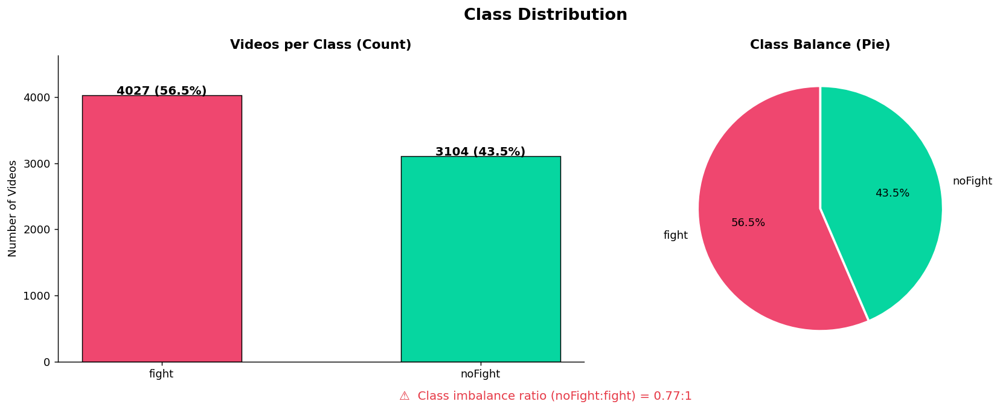

In [8]:
# ════════════════════════════════════════════════════════════════════════
#  4.1 — Class Distribution
# ════════════════════════════════════════════════════════════════════════

class_counts = valid_df.groupby('label').size().reset_index(name='count')
total        = class_counts['count'].sum()
class_counts['pct'] = (class_counts['count'] / total * 100).round(1)

COLORS = {'fight': '#EF476F', 'noFight': '#06D6A0'}

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Class Distribution', fontsize=15, fontweight='bold')

# Bar chart
bars = axes[0].bar(
    class_counts['label'],
    class_counts['count'],
    color=[COLORS[l] for l in class_counts['label']],
    edgecolor='black', linewidth=0.8, width=0.5
)
for bar, (_, row) in zip(bars, class_counts.iterrows()):
    axes[0].text(
        bar.get_x() + bar.get_width()/2,
        bar.get_height() + 10,
        f'{row["count"]} ({row["pct"]}%)',
        ha='center', fontweight='bold', fontsize=11
    )
axes[0].set_title('Videos per Class (Count)', fontweight='bold')
axes[0].set_ylabel('Number of Videos')
axes[0].set_ylim(0, class_counts['count'].max() * 1.15)

# Pie chart
axes[1].pie(
    class_counts['count'],
    labels=class_counts['label'],
    autopct='%1.1f%%',
    colors=[COLORS[l] for l in class_counts['label']],
    startangle=90,
    wedgeprops={'edgecolor': 'white', 'linewidth': 2}
)
axes[1].set_title('Class Balance (Pie)', fontweight='bold')

# Imbalance ratio annotation
counts = class_counts.set_index('label')['count']
if 'fight' in counts and 'noFight' in counts:
    ratio = counts['noFight'] / counts['fight']
    fig.text(0.5, -0.02, f'⚠️  Class imbalance ratio (noFight:fight) = {ratio:.2f}:1',
             ha='center', fontsize=11, color='#E63946')

plt.tight_layout()
plt.savefig('eda_class_distribution.png', bbox_inches='tight')
plt.show()

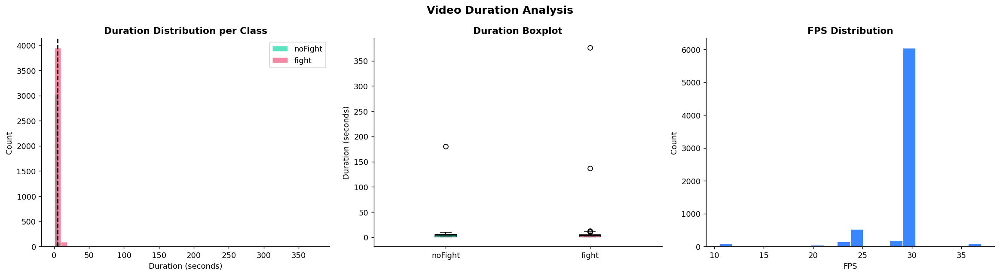

📊 Duration statistics (seconds):
          min  mean  median     max   std
label                                    
fight    0.60  3.50     4.4  375.73  6.66
noFight  0.83  3.83     5.0  179.90  3.65


In [9]:
# ════════════════════════════════════════════════════════════════════════
#  4.2 — Duration Distribution
# ════════════════════════════════════════════════════════════════════════

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Video Duration Analysis', fontsize=14, fontweight='bold')

for cls in CFG['classes']:
    sub = valid_df[valid_df['label'] == cls]
    axes[0].hist(sub['duration_sec'], bins=40, alpha=0.65,
                 color=COLORS[cls], label=cls, edgecolor='white')

axes[0].set_title('Duration Distribution per Class', fontweight='bold')
axes[0].set_xlabel('Duration (seconds)')
axes[0].set_ylabel('Count')
axes[0].legend()
axes[0].axvline(valid_df['duration_sec'].median(), color='black',
                lw=1.5, linestyle='--', label='Median')

# Box plot
data_boxes = [valid_df[valid_df['label'] == cls]['duration_sec'].values
              for cls in CFG['classes']]
bp = axes[1].boxplot(data_boxes, labels=CFG['classes'], patch_artist=True,
                     medianprops=dict(color='black', lw=2))
for patch, cls in zip(bp['boxes'], CFG['classes']):
    patch.set_facecolor(COLORS[cls])
    patch.set_alpha(0.7)
axes[1].set_title('Duration Boxplot', fontweight='bold')
axes[1].set_ylabel('Duration (seconds)')

# FPS distribution
axes[2].hist(valid_df['fps'], bins=20, color='#3A86FF', edgecolor='white')
axes[2].set_title('FPS Distribution', fontweight='bold')
axes[2].set_xlabel('FPS')
axes[2].set_ylabel('Count')

plt.tight_layout()
plt.savefig('eda_duration_analysis.png', bbox_inches='tight')
plt.show()

print('📊 Duration statistics (seconds):')
print(valid_df.groupby('label')['duration_sec'].agg(['min','mean','median','max','std']).round(2))

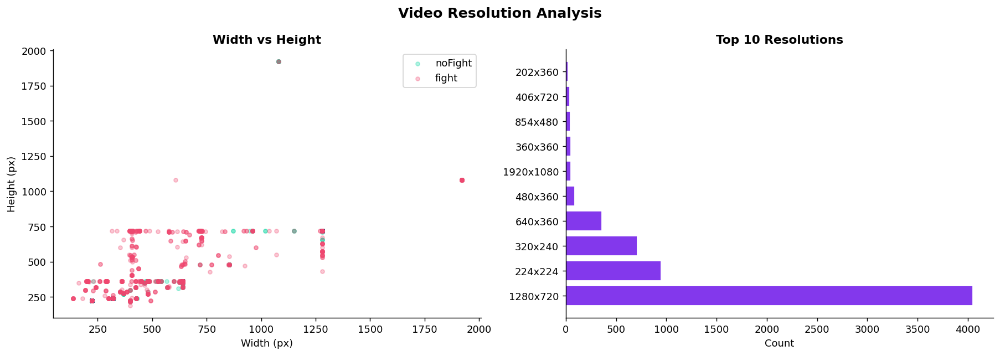

In [10]:
# ════════════════════════════════════════════════════════════════════════
#  4.3 — Resolution Landscape
# ════════════════════════════════════════════════════════════════════════

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Video Resolution Analysis', fontsize=14, fontweight='bold')

for cls in CFG['classes']:
    sub = valid_df[valid_df['label'] == cls]
    axes[0].scatter(sub['width'], sub['height'], alpha=0.3,
                    color=COLORS[cls], label=cls, s=15)

axes[0].set_title('Width vs Height', fontweight='bold')
axes[0].set_xlabel('Width (px)')
axes[0].set_ylabel('Height (px)')
axes[0].legend()

# Common resolutions bar chart
valid_df['resolution'] = valid_df['width'].astype(str) + 'x' + valid_df['height'].astype(str)
top_res = valid_df['resolution'].value_counts().head(10)
axes[1].barh(top_res.index, top_res.values, color='#8338EC', edgecolor='white')
axes[1].set_title('Top 10 Resolutions', fontweight='bold')
axes[1].set_xlabel('Count')

plt.tight_layout()
plt.savefig('eda_resolutions.png', bbox_inches='tight')
plt.show()

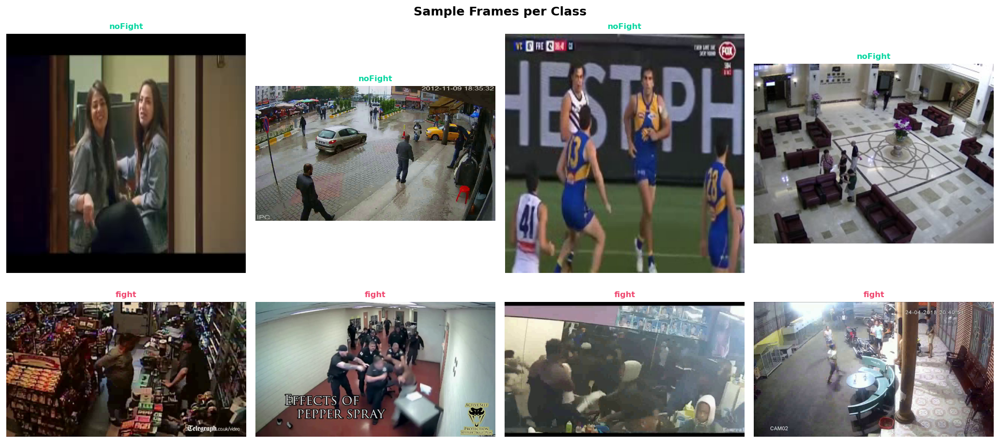

📷 Sample frames saved


In [11]:
# ════════════════════════════════════════════════════════════════════════
#  4.4 — Sample Frame Visualization
# ════════════════════════════════════════════════════════════════════════

def sample_frame(video_path: str, frame_idx: int = None) -> np.ndarray:
    """Extract a single frame from a video at a given index (or middle)."""
    try:
        cap   = cv2.VideoCapture(video_path)
        total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        if frame_idx is None:
            frame_idx = total // 2
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
        ret, frame = cap.read()
        cap.release()
        if ret:
            return cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    except Exception:
        pass
    return None


n_samples = 4  # samples per class
fig, axes = plt.subplots(2, n_samples, figsize=(4 * n_samples, 8))
fig.suptitle('Sample Frames per Class', fontsize=14, fontweight='bold')

for row, cls in enumerate(CFG['classes']):
    sub_paths = valid_df[valid_df['label'] == cls]['path'].sample(
        n_samples, random_state=SEED).tolist()

    for col, vpath in enumerate(sub_paths):
        frame = sample_frame(vpath)
        ax    = axes[row, col]
        if frame is not None:
            ax.imshow(frame)
            ax.set_title(f'{cls}', color=COLORS[cls], fontweight='bold', fontsize=9)
        else:
            ax.text(0.5, 0.5, 'N/A', ha='center', va='center')
        ax.axis('off')

plt.tight_layout()
plt.savefig('eda_sample_frames.png', bbox_inches='tight')
plt.show()
print('📷 Sample frames saved')

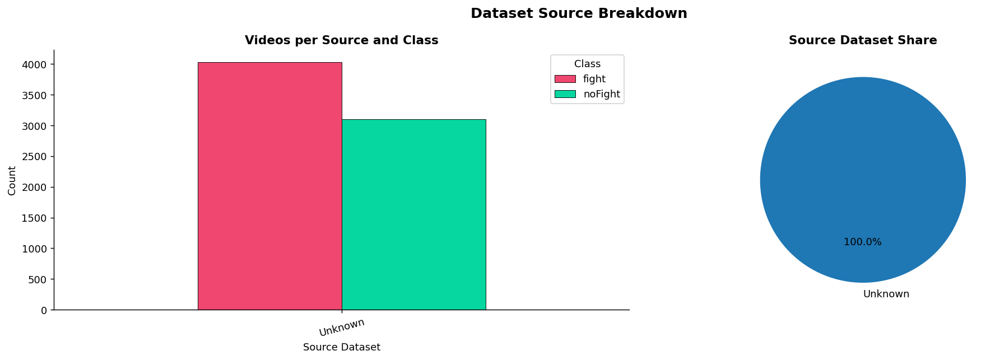

In [12]:
# ════════════════════════════════════════════════════════════════════════
#  4.5 — Dataset Source Breakdown
# ════════════════════════════════════════════════════════════════════════

# Infer source from original path stored in df_meta
def infer_source(path: str) -> str:
    p = str(path)
    if 'mohamedmustafa' in p:  return 'RLVS'
    if 'magicearth25'   in p:  return 'RLVS / RWF-2000'
    if 'marzoukhedi'    in p:  return 'violence-by-hedi'
    if 'toluwaniaremu'  in p:  return 'SCVD'
    return 'Unknown'

valid_df['source'] = valid_df['path'].apply(infer_source)

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle('Dataset Source Breakdown', fontsize=14, fontweight='bold')

src_counts = valid_df.groupby(['source', 'label']).size().unstack(fill_value=0)
src_counts.plot(kind='bar', ax=axes[0], color=[COLORS[c] for c in src_counts.columns],
                edgecolor='black', linewidth=0.5)
axes[0].set_title('Videos per Source and Class', fontweight='bold')
axes[0].set_xlabel('Source Dataset')
axes[0].set_ylabel('Count')
axes[0].tick_params(axis='x', rotation=15)
axes[0].legend(title='Class')

src_total = valid_df['source'].value_counts()
axes[1].pie(src_total.values, labels=src_total.index, autopct='%1.1f%%',
            startangle=90, wedgeprops={'edgecolor': 'white', 'linewidth': 2})
axes[1].set_title('Source Dataset Share', fontweight='bold')

plt.tight_layout()
plt.savefig('eda_source_breakdown.png', bbox_inches='tight')
plt.show()

<a id='5'></a>
## 5. Video Processing & Conversion



In [13]:
# ════════════════════════════════════════════════════════════════════════
#  CONVERT ALL VIDEOS TO MP4 (H264) via FFmpeg
# ════════════════════════════════════════════════════════════════════════

import subprocess

def convert_to_mp4(src: str, dst: str) -> bool:
    """
    Convert src video to dst .mp4 using H264 via FFmpeg.
    Returns True if successful.
    """
    try:
        cmd = [
            'ffmpeg', '-y', '-i', src,
            '-c:v', 'libx264',
            '-preset', 'veryfast',
            '-crf', '23',
            '-c:a', 'aac',
            '-movflags', '+faststart',
            dst
        ]
        result = subprocess.run(cmd, capture_output=True, timeout=120)
        return result.returncode == 0
    except subprocess.TimeoutExpired:
        log.warning(f'Timeout converting: {src}')
        return False
    except Exception as e:
        log.warning(f'Conversion error {src}: {e}')
        return False


def process_all_videos(valid_df: pd.DataFrame, cfg: dict) -> pd.DataFrame:
    """
    For each video in valid_df:
      - If already .mp4: symlink/copy directly
      - Otherwise: convert with FFmpeg
    Returns updated DataFrame with 'converted_path' column.
    """
    out_base = Path(cfg['converted_dir'])
    for cls in cfg['classes']:
        (out_base / cls).mkdir(parents=True, exist_ok=True)

    paths_out = []
    convert_count  = 0
    skip_count     = 0
    error_count    = 0

    for _, row in tqdm(valid_df.iterrows(), total=len(valid_df), desc='Processing videos'):
        src   = row['path']
        label = row['label']
        stem  = Path(row['filename']).stem
        dst   = str(out_base / label / f'{stem}.mp4')

        if os.path.exists(dst):
            paths_out.append(dst)
            skip_count += 1
            continue

        ext = Path(src).suffix.lower()

        if ext == '.mp4':
            # Already MP4 — just symlink to avoid copying large files
            try:
                os.symlink(os.path.realpath(src), dst)
                paths_out.append(dst)
                skip_count += 1
            except Exception:
                try:
                    shutil.copy2(src, dst)
                    paths_out.append(dst)
                    skip_count += 1
                except Exception as e:
                    log.warning(f'Failed: {src} → {e}')
                    paths_out.append(None)
                    error_count += 1
        else:
            ok = convert_to_mp4(src, dst)
            if ok:
                paths_out.append(dst)
                convert_count += 1
            else:
                log.warning(f'Conversion failed: {src}')
                paths_out.append(None)
                error_count += 1

    valid_df = valid_df.copy()
    valid_df['converted_path'] = paths_out

    print(f'\n🎬 Video Processing Complete:')
    print(f'   Already MP4 / skipped : {skip_count:5d}')
    print(f'   Converted to MP4      : {convert_count:5d}')
    print(f'   Errors / skipped      : {error_count:5d}')

    return valid_df[valid_df['converted_path'].notna()].copy()


final_df = process_all_videos(valid_df, CFG)
print(f'\n✅ Final dataset size: {len(final_df)} videos')
print(final_df.groupby('label').size())

Processing videos:   0%|          | 0/7131 [00:00<?, ?it/s]


🎬 Video Processing Complete:
   Already MP4 / skipped :  1938
   Converted to MP4      :  5193
   Errors / skipped      :     0

✅ Final dataset size: 7131 videos
label
fight      4027
noFight    3104
dtype: int64


<a id='6'></a>
## 6. Dataset & DataLoaders


In [14]:
# ════════════════════════════════════════════════════════════════════════
#  BALANCE + SPLIT — skipped if checkpoint exists
# ════════════════════════════════════════════════════════════════════════

if TRAINING_DONE:
    # ── RESUME: load splits from saved CSVs ──────────────────────────────
    import pandas as pd
    train_df = pd.read_csv(os.path.join(CFG['splits_dir'], 'train_df.csv'))
    val_df   = pd.read_csv(os.path.join(CFG['splits_dir'], 'val_df.csv'))
    test_df  = pd.read_csv(os.path.join(CFG['splits_dir'], 'test_df.csv'))
    print('Splits loaded from CSV')
    print(f'  train={len(train_df)} | val={len(val_df)} | test={len(test_df)}')
else:
    # ── TRAINING: compute balance + split ────────────────────────────────
    final_df['label_int'] = final_df['label'].map({'noFight': 0, 'fight': 1})

    if CFG['balance_50_50']:
        fight_df   = final_df[final_df['label'] == 'fight']
        nofight_df = final_df[final_df['label'] == 'noFight']
        n_min      = min(len(fight_df), len(nofight_df))
        fight_df   = fight_df.sample(n=n_min, random_state=SEED)
        nofight_df = nofight_df.sample(n=n_min, random_state=SEED)
        balanced_df = pd.concat([fight_df, nofight_df]).sample(frac=1, random_state=SEED).reset_index(drop=True)
        print(f'Balanced 50/50: fight={len(fight_df)} noFight={len(nofight_df)} total={len(balanced_df)}')
    else:
        balanced_df = final_df.copy()

    train_val_df, test_df = train_test_split(
        balanced_df, test_size=CFG['test_ratio'],
        random_state=SEED, stratify=balanced_df['label_int']
    )
    val_relative = CFG['val_ratio'] / (CFG['train_ratio'] + CFG['val_ratio'])
    train_df, val_df = train_test_split(
        train_val_df, test_size=val_relative,
        random_state=SEED, stratify=train_val_df['label_int']
    )

    # ── Save splits immediately ───────────────────────────────────────────
    train_df.to_csv(os.path.join(CFG['splits_dir'], 'train_df.csv'), index=False)
    val_df.to_csv(  os.path.join(CFG['splits_dir'], 'val_df.csv'),   index=False)
    test_df.to_csv( os.path.join(CFG['splits_dir'], 'test_df.csv'),  index=False)
    print('Splits saved to CSV')

    def split_summary(name, df):
        n_f = df['label_int'].sum()
        n_n = (df['label_int'] == 0).sum()
        ratio = df['label_int'].mean()
        sym = 'OK' if 0.45 <= ratio <= 0.55 else 'WARN'
        print(f'  {sym} {name:8s}: {len(df):5d} | fight={n_f:4d} ({100*ratio:.1f}%) | noFight={n_n:4d}')

    print('Stratified 3-Way Split:')
    split_summary('Train', train_df)
    split_summary('Val',   val_df)
    split_summary('Test',  test_df)


Balanced 50/50: fight=3104 noFight=3104 total=6208
Splits saved to CSV
Stratified 3-Way Split:
  OK Train   :  4966 | fight=2483 (50.0%) | noFight=2483
  OK Val     :   621 | fight= 311 (50.1%) | noFight= 310
  OK Test    :   621 | fight= 310 (49.9%) | noFight= 311


In [15]:
# ════════════════════════════════════════════════════════════════════════
#  TRANSFORMS — VideoSwin-T specific
#  Input expected: (C, T, H, W) — normalized per Kinetics-400 stats
# ════════════════════════════════════════════════════════════════════════

# Kinetics-400 normalization stats (same as ImageNet channel-wise)
KINETICS_MEAN = [0.45, 0.45, 0.45]
KINETICS_STD  = [0.225, 0.225, 0.225]

# Per-frame spatial transforms (applied to each frame independently)
train_spatial = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((CFG['img_size'] + 32, CFG['img_size'] + 32)),  # slightly larger for crop
    transforms.RandomCrop(CFG['img_size']),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2, hue=0.05),
    transforms.RandomGrayscale(p=0.05),
    transforms.ToTensor(),
    transforms.Normalize(mean=KINETICS_MEAN, std=KINETICS_STD)
])

val_spatial = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((CFG['img_size'], CFG['img_size'])),
    transforms.ToTensor(),
    transforms.Normalize(mean=KINETICS_MEAN, std=KINETICS_STD)
])

print('✅ VideoSwin-T transforms ready (Kinetics-400 normalization)')
print(f'   Train: Resize({CFG["img_size"]+32}) → RandomCrop({CFG["img_size"]}) → Flip → ColorJitter → Normalize')
print(f'   Val  : Resize({CFG["img_size"]}) → Normalize')


✅ VideoSwin-T transforms ready (Kinetics-400 normalization)
   Train: Resize(256) → RandomCrop(224) → Flip → ColorJitter → Normalize
   Val  : Resize(224) → Normalize


In [16]:
# ════════════════════════════════════════════════════════════════════════
#  DATASET CLASS — VideoSwin format: (C, T, H, W)
# ════════════════════════════════════════════════════════════════════════

class ViolenceDataset(Dataset):
    """
    Returns clips as tensors of shape (C, T, H, W) — VideoSwin-T expected format.
    Temporal sampling: uniform stride across video duration.
    """
    def __init__(self, dataframe, num_frames=32, stride=2, transform=None):
        self.df         = dataframe.reset_index(drop=True)
        self.num_frames = num_frames
        self.stride     = stride
        self.transform  = transform

        f = self.df['label_int'].sum()
        n = (self.df['label_int'] == 0).sum()
        print(f'📁 Dataset: {len(self.df)} videos | fight={f} | noFight={n}')

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row    = self.df.iloc[idx]
        frames = self._load_frames(row['converted_path'])
        if frames is None:
            idx    = (idx + 1) % len(self.df)
            row    = self.df.iloc[idx]
            frames = self._load_frames(row['converted_path'])

        # Apply per-frame spatial transform
        if self.transform:
            frames = [self.transform(f) for f in frames]   # list of (C, H, W)

        # Stack → (T, C, H, W) → permute → (C, T, H, W)
        clip  = torch.stack(frames, dim=0).permute(1, 0, 2, 3)  # (C, T, H, W)
        label = torch.tensor(row['label_int'], dtype=torch.long)
        return clip, label

    def _load_frames(self, path):
        """Uniformly sample num_frames with temporal stride."""
        try:
            cap   = cv2.VideoCapture(path)
            total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
            if total <= 0:
                cap.release(); return None

            # Compute sampled frame indices with stride
            max_idx  = total - 1
            # Effective window: stride * num_frames frames apart
            span     = min(self.stride * self.num_frames, total)
            start    = max(0, total // 2 - span // 2)
            indices  = set(
                np.linspace(start, min(start + span - 1, max_idx),
                            self.num_frames, dtype=int).tolist()
            )

            frames = []
            i = 0
            while len(frames) < self.num_frames:
                ret, frame = cap.read()
                if not ret: break
                if i in indices:
                    frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                i += 1
            cap.release()

            if not frames: return None
            while len(frames) < self.num_frames:
                frames.append(frames[-1])   # pad last frame
            return frames[:self.num_frames]

        except Exception as e:
            log.warning(f'Frame error {path}: {e}')
            return None


# Instantiate datasets
train_ds = ViolenceDataset(train_df, CFG['num_frames'], CFG['frame_stride'], train_spatial)
val_ds   = ViolenceDataset(val_df,   CFG['num_frames'], CFG['frame_stride'], val_spatial)
test_ds  = ViolenceDataset(test_df,  CFG['num_frames'], CFG['frame_stride'], val_spatial)


📁 Dataset: 4966 videos | fight=2483 | noFight=2483
📁 Dataset: 621 videos | fight=311 | noFight=310
📁 Dataset: 621 videos | fight=310 | noFight=311


In [17]:
# ════════════════════════════════════════════════════════════════════════
#  WEIGHTED SAMPLER + DATALOADERS
#  Batch size decreases as more layers become trainable (VRAM management)
# ════════════════════════════════════════════════════════════════════════

# Per-stage batch sizes — deeper unfreezing = smaller batch to stay in VRAM
STAGE_BATCH = {
    'head_only' : 8,
    'stage4'    : 6,
    'stage3_4'  : 4,
    'full'      : 2,   # kept for safety but stage is removed
}

labels_train      = train_df['label_int'].values
class_counts_tr   = np.bincount(labels_train)
class_weights_tr  = 1.0 / class_counts_tr
sample_weights    = class_weights_tr[labels_train]

sampler = WeightedRandomSampler(
    weights     = torch.DoubleTensor(sample_weights),
    num_samples = len(train_ds),
    replacement = True
)

def make_train_loader(batch_size):
    """Recreate train loader with a given batch size (called at each stage start)."""
    return DataLoader(
        train_ds, batch_size=batch_size, sampler=sampler,
        num_workers=CFG['num_workers'], pin_memory=True, persistent_workers=True
    )

# Default loader at base batch size
train_loader = make_train_loader(CFG['batch_size'])

val_loader = DataLoader(
    val_ds, batch_size=CFG['batch_size'], shuffle=False,
    num_workers=CFG['num_workers'], pin_memory=True, persistent_workers=True
)
test_loader = DataLoader(
    test_ds, batch_size=CFG['batch_size'], shuffle=False,
    num_workers=CFG['num_workers'], pin_memory=True, persistent_workers=True
)

print(f'\n🔄 DataLoaders ready (per-stage batch sizes: {STAGE_BATCH})')
print(f'   Val   : {len(val_loader)} batches')
print(f'   Test  : {len(test_loader)} batches')
print(f'   Clip shape expected: (B, C=3, T={CFG["num_frames"]}, H={CFG["img_size"]}, W={CFG["img_size"]})')

# Sanity check — one batch
sample_batch, sample_labels = next(iter(train_loader))
print(f'\n✅ Batch shape : {sample_batch.shape}  (B, C, T, H, W)')
print(f'   Labels       : {sample_labels.tolist()}')
del sample_batch, sample_labels



🔄 DataLoaders ready (per-stage batch sizes: {'head_only': 8, 'stage4': 6, 'stage3_4': 4, 'full': 2})
   Val   : 78 batches
   Test  : 78 batches
   Clip shape expected: (B, C=3, T=32, H=224, W=224)

✅ Batch shape : torch.Size([8, 3, 32, 224, 224])  (B, C, T, H, W)
   Labels       : [1, 0, 1, 0, 0, 0, 0, 1]


<a id='7'></a>
## 7. Model — Video Swin Transformer (Finetuning)

**VideoSwin-T** (Tiny) — pretrained on Kinetics-400 via `torchvision.models.video`.

### Finetuning Strategy — Stage-wise Progressive Unfreezing

```
Stage 1 (epochs 1-5)   : Freeze ALL backbone → train head only          LR=3e-4
Stage 2 (epochs 6-13)  : Unfreeze stage 4 (deepest temporal block)      LR=1e-4
Stage 3 (epochs 14-21) : Unfreeze stage 3+4                             LR=5e-5
Stage 4 (epochs 22-30) : Unfreeze entire network (full fine-tuning)     LR=2e-5
```

This approach prevents **catastrophic forgetting** of Kinetics-400 pretrained weights  
and achieves better generalization than training end-to-end from scratch.


In [18]:
# ════════════════════════════════════════════════════════════════════════
#  VideoSwin-T — Load pretrained from torchvision
# ════════════════════════════════════════════════════════════════════════

from torchvision.models.video import swin3d_t, Swin3D_T_Weights

class VideoSwinViolence(nn.Module):
    """
    Video Swin Transformer Tiny — finetuned for binary violence detection.

    Architecture:
      - Backbone : VideoSwin-T pretrained on Kinetics-400 (torchvision)
      - Head     : custom classification head replacing the K400 head
      - Input    : (B, C, T, H, W) — e.g. (B, 3, 32, 224, 224)
      - Output   : (B, 2) logits

    Kinetics-400 pretrained weights give strong priors for:
      - Human body motion & poses
      - Sports / physical interaction
      - Action dynamics over time
    All of which are highly relevant for fight detection.
    """
    def __init__(self, cfg, num_classes=2):
        super().__init__()

        # ── Load pretrained VideoSwin-T ────────────────────────────────
        weights   = Swin3D_T_Weights.KINETICS400_V1
        backbone  = swin3d_t(weights=weights)

                # ── Inspect head structure (varies by torchvision version) ───────
        # torchvision SwinTransformer3d.forward() already does:
        #   x = self.avgpool(x)        # (B, C, 1, 1, 1)
        #   x = torch.flatten(x, 1)   # (B, C)
        #   x = self.head(x)           # our head receives flat (B, C)
        # → We must NOT add another pool or flatten in our head.
        if isinstance(backbone.head, nn.Sequential):
            in_features = backbone.head[-1].in_features
        elif isinstance(backbone.head, nn.Linear):
            in_features = backbone.head.in_features
        else:
            in_features = backbone.head.in_features

        self.backbone = backbone
        self.feat_dim = in_features

        # ── Custom violence detection head (receives flat (B, C) input) ──
        # backbone already avg-pools and flattens before calling head
        self.head = nn.Sequential(
            nn.Dropout(cfg['fc_dropout']),
            nn.Linear(in_features, 256),
            nn.LayerNorm(256),
            nn.GELU(),
            nn.Dropout(cfg['dropout']),
            nn.Linear(256, num_classes)
        )

        # Replace backbone head — receives (B, feat_dim) directly
        self.backbone.head = self.head

        # ── Freeze everything initially ────────────────────────────────
        self._freeze_all()

        # ── Unfreeze head only (stage 1 start) ────────────────────────
        self._unfreeze_layers(['head'])

        log.info(f'VideoSwin-T loaded — pretrained Kinetics-400 | feat_dim={in_features}')

        # Debug: print backbone feature layout (run once to confirm indices)
        if os.environ.get('SWIN_DEBUG', '0') == '1':
            for j, m in enumerate(self.backbone.features):
                print(f'  features[{j}]: {type(m).__name__}')

    def forward(self, x):
        """x: (B, C, T, H, W)"""
        return self.backbone(x)

    # ── Layer management helpers ───────────────────────────────────────

    def _freeze_all(self):
        for p in self.backbone.parameters():
            p.requires_grad = False

    def _unfreeze_layers(self, layer_names):
        """Unfreeze specified layer groups. 'all' unfreezes everything."""
        if 'all' in layer_names:
            for p in self.backbone.parameters():
                p.requires_grad = True
            return

        # torchvision SwinTransformer3d uses 'features' (nn.Sequential of stages)
        # features[0] = PatchEmbed, features[1..] = SwinTransformer stages
        feats = self.backbone.features   # nn.Sequential
        # Filter only the SwinTransformerBlock stages (skip PatchMerging / PatchEmbed)
        stage_modules = [m for m in feats if hasattr(m, 'window_size') or
                         (hasattr(m, '__iter__') and any(hasattr(b, 'attn') for b in (m if hasattr(m, '__iter__') else [])))]
        # Simpler: just index features directly
        # features layout: [PatchEmbed, Stage1, Merge, Stage2, Merge, Stage3, Merge, Stage4, Norm]
        # Swin-T: features[0]=patch, [1]=stage1, [2]=merge, [3]=stage2, [4]=merge, [5]=stage3, [6]=merge, [7]=stage4, [8]=norm
        target_modules = {
            'head'   : self.backbone.head,
            'layer4' : self.backbone.features[-2],   # stage4 (before norm)
            'layer3' : self.backbone.features[-4],   # stage3
            'layer2' : self.backbone.features[-6],   # stage2
            'layer1' : self.backbone.features[1],    # stage1
            'norm'   : self.backbone.features[-1],   # final norm
            'patch'  : self.backbone.features[0],    # patch embed
        }
        for name in layer_names:
            if name in target_modules:
                for p in target_modules[name].parameters():
                    p.requires_grad = True
            else:
                log.warning(f'Unfreeze: key "{name}" not in target_modules — skipped')

    def count_trainable(self):
        total     = sum(p.numel() for p in self.parameters())
        trainable = sum(p.numel() for p in self.parameters() if p.requires_grad)
        return total, trainable

    def set_stage(self, stage_cfg):
        """Apply a finetune stage: unfreeze layers and return LR."""
        self._freeze_all()
        self._unfreeze_layers(stage_cfg['unfreeze'])
        total, trainable = self.count_trainable()
        log.info(f'Stage [{stage_cfg["name"]}] | LR={stage_cfg["lr"]} | '
                 f'Trainable: {trainable:,}/{total:,} ({100*trainable/total:.1f}%)')
        return stage_cfg['lr']


# ── Instantiate model ─────────────────────────────────────────────────────────
model = VideoSwinViolence(CFG).to(DEVICE)

if TRAINING_DONE:
    # RESUME: load best weights immediately, skip training
    _ckpt = torch.load(CFG['best_model_path'], map_location=DEVICE)
    _weights = _ckpt.get('model_state_dict', _ckpt)
    model.load_state_dict(_weights)
    model.eval()
    best_val_acc = _ckpt.get('best_val_acc', float('nan'))
    best_epoch   = _ckpt.get('best_epoch',   -1)
    history      = _ckpt.get('finetune_history', {})
    global_epoch = best_epoch
    print(f'RESUME: weights loaded from {CFG["best_model_path"]}')
    print(f'  best_val_acc={best_val_acc:.4f}  epoch={best_epoch}')
    print('  Training will be SKIPPED — go directly to Evaluation or XAI')

# ── Gradient checkpointing — trades compute for VRAM ─────────────────────────
# Critical for VideoSwin-T: saves ~30-40% peak VRAM during backprop
# at the cost of ~15-20% slower training (recomputes activations on backward pass)
def enable_grad_checkpointing(backbone):
    """Patch all SwinTransformerBlock forward methods to use activation checkpointing."""
    from torch.utils.checkpoint import checkpoint as ckpt_fn
    patched = 0
    for stage in backbone.features:
        # Each stage is a Sequential of SwinTransformerBlock (or PatchMerging)
        iterable = list(stage) if hasattr(stage, '__iter__') else [stage]
        for block in iterable:
            if hasattr(block, 'attn'):  # SwinTransformerBlock has .attn
                orig_fwd = block.forward
                def make_ckpt(fn):
                    def _forward(x):
                        return ckpt_fn(fn, x, use_reentrant=False)
                    return _forward
                block.forward = make_ckpt(orig_fwd)
                patched += 1
    return patched

n_patched = enable_grad_checkpointing(model.backbone)
print(f'✅ Gradient checkpointing enabled on {n_patched} SwinTransformerBlocks')

total_p, train_p = model.count_trainable()
print(f'✅ VideoSwin-T Violence Model ready')
print(f'   Total params     : {total_p:,}')
print(f'   Trainable params : {train_p:,}  ({100*train_p/total_p:.1f}%)')
print(f'   Backbone         : Kinetics-400 pretrained (frozen)')
print(f'   Head             : random init (trainable)')
print(f'\n🔍 Backbone feature layout:')
for j, m in enumerate(model.backbone.features):
    n_params = sum(p.numel() for p in m.parameters()) if hasattr(m, 'parameters') else 0
    print(f'   features[{j}]: {type(m).__name__:<30s}  params={n_params:,}')


Downloading: "https://download.pytorch.org/models/swin3d_t-7615ae03.pth" to /root/.cache/torch/hub/checkpoints/swin3d_t-7615ae03.pth


100%|██████████| 122M/122M [00:01<00:00, 78.9MB/s] 
2026-05-05 16:08:37,800 | INFO | VideoSwin-T loaded — pretrained Kinetics-400 | feat_dim=768


✅ Gradient checkpointing enabled on 12 SwinTransformerBlocks
✅ VideoSwin-T Violence Model ready
   Total params     : 28,048,360
   Trainable params : 197,890  (0.7%)
   Backbone         : Kinetics-400 pretrained (frozen)
   Head             : random init (trainable)

🔍 Backbone feature layout:
   features[0]: Sequential                      params=238,890
   features[1]: PatchMerging                    params=74,496
   features[2]: Sequential                      params=920,148
   features[3]: PatchMerging                    params=296,448
   features[4]: Sequential                      params=10,829,304
   features[5]: PatchMerging                    params=1,182,720
   features[6]: Sequential                      params=14,297,424


<a id='8'></a>
## 8. Stage-wise Finetuning


In [19]:
# ════════════════════════════════════════════════════════════════════════
#  LOSS + SCALER — skipped if checkpoint exists
# ════════════════════════════════════════════════════════════════════════

if not TRAINING_DONE:
    labels_arr  = train_df['label_int'].values
    class_cnts  = np.bincount(labels_arr)
    loss_w      = torch.tensor(1.0 / class_cnts, dtype=torch.float32)
    loss_w      = loss_w / loss_w.sum() * 2
    loss_w      = loss_w.to(DEVICE)
    criterion   = nn.CrossEntropyLoss(weight=loss_w, label_smoothing=CFG['label_smooth'])
    scaler      = torch.amp.GradScaler('cuda')
    best_val_acc = 0.0
    best_epoch   = 0
    patience_ctr = 0
    global_epoch = 0
    history = {
        'train_loss': [], 'train_acc': [],
        'val_loss'  : [], 'val_acc'  : [],
        'lr': [], 'acc_gap': [], 'loss_gap': [], 'stage': []
    }
    print(f'Loss + Scaler ready')
    print(f'  Class weights: noFight={loss_w[0]:.4f}, fight={loss_w[1]:.4f}')
else:
    print('RESUME MODE: loss/scaler skipped')
    # criterion/scaler not needed — model already loaded and eval


Loss + Scaler ready
  Class weights: noFight=1.0000, fight=1.0000


In [20]:
# ════════════════════════════════════════════════════════════════════════
#  TRAINING FUNCTIONS — skipped if checkpoint exists
# ════════════════════════════════════════════════════════════════════════

if not TRAINING_DONE:
    # ════════════════════════════════════════════════════════════════════════
    # ════════════════════════════════════════════════════════════════════════
    
    def run_epoch_train(model, loader, optimizer, criterion, scaler, device, grad_clip):
        model.train()
        total_loss = correct = total = 0
    
        for frames, labels in loader:
            frames, labels = frames.to(device), labels.to(device)
            optimizer.zero_grad()
    
            with torch.amp.autocast('cuda'):
                out  = model(frames)
                loss = criterion(out, labels)
    
            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            nn.utils.clip_grad_norm_(model.parameters(), grad_clip)
            scaler.step(optimizer); scaler.update()
    
            total_loss += loss.item() * labels.size(0)
            correct    += (out.argmax(1) == labels).sum().item()
            total      += labels.size(0)
    
        return total_loss / total, correct / total
    
    
    def run_epoch_val(model, loader, criterion, device):
        model.eval()
        total_loss = correct = total = 0
    
        with torch.no_grad():
            for frames, labels in loader:
                frames, labels = frames.to(device), labels.to(device)
                with torch.amp.autocast('cuda'):
                    out  = model(frames)
                    loss = criterion(out, labels)
                total_loss += loss.item() * labels.size(0)
                correct    += (out.argmax(1) == labels).sum().item()
                total      += labels.size(0)
    
        return total_loss / total, correct / total
    
    
    def warmup_lr(optimizer, epoch, warmup_epochs, base_lr):
        """Linear warmup for first warmup_epochs epochs."""
        if epoch <= warmup_epochs:
            lr = base_lr * epoch / warmup_epochs
            for g in optimizer.param_groups:
                g['lr'] = lr
    
    print('✅ Training functions ready')
    
else:
    print('RESUME MODE: training functions skipped')


✅ Training functions ready


In [21]:
# ════════════════════════════════════════════════════════════════════════
#  STAGE-WISE FINETUNING LOOP — skipped if checkpoint exists
# ════════════════════════════════════════════════════════════════════════

if TRAINING_DONE:
    print('RESUME MODE: training loop skipped')
    print(f'  Best val_acc={best_val_acc:.4f} at epoch {best_epoch}')
else:
    STAGE_COLORS = ['#3A86FF', '#FF6B6B', '#06D6A0', '#FF9F1C']
    patience_ctr = 0

    for stage_idx, stage_cfg in enumerate(CFG['finetune_stages']):
        stage_name = stage_cfg['name']
        base_lr    = model.set_stage(stage_cfg)
        total_p, train_p = model.count_trainable()

        n_stages = len(CFG['finetune_stages'])
        print(f'\n{"="*60}')
        print(f'  STAGE {stage_idx+1}/{n_stages} [{stage_name.upper()}]')
        print(f'  LR={base_lr} | Trainable={train_p:,}/{total_p:,} ({100*train_p/total_p:.1f}%)')
        print(f'{"="*60}')

        stage_bs     = STAGE_BATCH.get(stage_name, CFG['batch_size'])
        train_loader = make_train_loader(stage_bs)

        optimizer = torch.optim.AdamW(
            filter(lambda p: p.requires_grad, model.parameters()),
            lr=base_lr, weight_decay=CFG['weight_decay']
        )
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
            optimizer, T_max=stage_cfg['epochs']
        )

        for local_ep in range(1, stage_cfg['epochs'] + 1):
            global_epoch += 1
            t0 = time.time()

            if stage_idx == 0:
                warmup_lr(optimizer, local_ep, CFG['warmup_epochs'], base_lr)

            train_loss, train_acc = run_epoch_train(
                model, train_loader, optimizer, criterion,
                scaler, DEVICE, CFG['grad_clip']
            )
            val_loss, val_acc = run_epoch_val(model, val_loader, criterion, DEVICE)

            if stage_idx > 0 or local_ep > CFG['warmup_epochs']:
                scheduler.step()
            current_lr = optimizer.param_groups[0]['lr']

            acc_gap  = train_acc - val_acc
            loss_gap = val_loss - train_loss
            overfit  = acc_gap > CFG['overfitting_gap']
            sym      = 'OVERFIT' if overfit else 'OK'

            history['train_loss'].append(train_loss)
            history['train_acc' ].append(train_acc)
            history['val_loss'  ].append(val_loss)
            history['val_acc'   ].append(val_acc)
            history['lr'        ].append(current_lr)
            history['acc_gap'   ].append(acc_gap)
            history['loss_gap'  ].append(loss_gap)
            history['stage'     ].append(stage_name)

            elapsed = time.time() - t0
            print(f'  Ep {global_epoch:02d} [{stage_name:10s}] | '
                  f'Train {train_loss:.4f}/{train_acc:.4f} | '
                  f'Val {val_loss:.4f}/{val_acc:.4f} | '
                  f'Gap {acc_gap:+.4f} {sym} | '
                  f'LR {current_lr:.2e} | {elapsed:.1f}s')

            # ── Save last checkpoint every epoch (safe resume point) ──────
            torch.save({
                'model_state_dict' : model.state_dict(),
                'epoch'            : global_epoch,
                'stage'            : stage_name,
                'val_acc'          : val_acc,
                'best_val_acc'     : best_val_acc,
                'best_epoch'       : best_epoch,
                'cfg'              : CFG,
                'finetune_history' : history,
            }, CFG['last_model_path'])

            if val_acc > best_val_acc:
                best_val_acc = val_acc
                best_epoch   = global_epoch
                patience_ctr = 0
                # ── Save best checkpoint (never overwritten after this) ────
                torch.save({
                    'model_state_dict' : model.state_dict(),
                    'best_val_acc'     : best_val_acc,
                    'best_epoch'       : best_epoch,
                    'cfg'              : CFG,
                    'finetune_history' : history,
                }, CFG['best_model_path'])
                print(f'  Saved best model  val_acc={best_val_acc:.4f}')
            else:
                patience_ctr += 1
                if patience_ctr >= CFG['patience']:
                    print(f'  Early stopping at epoch {global_epoch}')
                    break

        # ── End-of-stage memory cleanup ───────────────────────────────────
        del optimizer, scheduler
        torch.cuda.empty_cache()
        import gc; gc.collect()
        patience_ctr = 0

    with open(CFG['history_path'], 'w') as f:
        json.dump(history, f)

    # ── Update TRAINING_DONE so downstream cells know training finished ──
    TRAINING_DONE = True
    print(f'\nBest Val Accuracy: {best_val_acc:.4f}  (epoch {best_epoch})')
    print(f'Checkpoints saved:')
    print(f'  best -> {CFG["best_model_path"]}')
    print(f'  last -> {CFG["last_model_path"]}')


2026-05-05 16:08:38,011 | INFO | Stage [head_only] | LR=0.0003 | Trainable: 197,890/28,048,360 (0.7%)



  STAGE 1/3 [HEAD_ONLY]
  LR=0.0003 | Trainable=197,890/28,048,360 (0.7%)


[h264 @ 0x143a3ac0] mb_type 104 in P slice too large at 98 31
[h264 @ 0x143a3ac0] error while decoding MB 98 31


  Ep 01 [head_only ] | Train 0.5240/0.7634 | Val 0.4730/0.8229 | Gap -0.0595 OK | LR 1.50e-04 | 1260.1s
  Saved best model  val_acc=0.8229
  Ep 02 [head_only ] | Train 0.4657/0.8184 | Val 0.4134/0.8599 | Gap -0.0415 OK | LR 3.00e-04 | 1394.2s
  Saved best model  val_acc=0.8599


[h264 @ 0x152af140] mb_type 104 in P slice too large at 98 31
[h264 @ 0x152af140] error while decoding MB 98 31
[h264 @ 0x13f79380] mb_type 104 in P slice too large at 98 31
[h264 @ 0x13f79380] error while decoding MB 98 31


  Ep 03 [head_only ] | Train 0.4277/0.8550 | Val 0.4063/0.8615 | Gap -0.0065 OK | LR 2.71e-04 | 1383.5s
  Saved best model  val_acc=0.8615
  Ep 04 [head_only ] | Train 0.4110/0.8643 | Val 0.4032/0.8776 | Gap -0.0133 OK | LR 1.96e-04 | 1336.6s
  Saved best model  val_acc=0.8776


[h264 @ 0x14435b40] mb_type 104 in P slice too large at 98 31
[h264 @ 0x14435b40] error while decoding MB 98 31


  Ep 05 [head_only ] | Train 0.3854/0.8800 | Val 0.3985/0.8776 | Gap +0.0024 OK | LR 1.04e-04 | 1334.2s


2026-05-05 18:00:34,479 | INFO | Stage [stage4] | LR=0.0001 | Trainable: 1,380,610/28,048,360 (4.9%)



  STAGE 2/3 [STAGE4]
  LR=0.0001 | Trainable=1,380,610/28,048,360 (4.9%)


[h264 @ 0x1add5800] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1add5800] error while decoding MB 98 31


  Ep 06 [stage4    ] | Train 0.3581/0.9048 | Val 0.3796/0.8969 | Gap +0.0078 OK | LR 9.62e-05 | 1362.5s
  Saved best model  val_acc=0.8969


[h264 @ 0x1add4d40] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1add4d40] error while decoding MB 98 31
[h264 @ 0x1add5800] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1add5800] error while decoding MB 98 31


  Ep 07 [stage4    ] | Train 0.3331/0.9150 | Val 0.3800/0.9018 | Gap +0.0133 OK | LR 8.54e-05 | 1342.9s
  Saved best model  val_acc=0.9018


[h264 @ 0x498eb8c0] mb_type 104 in P slice too large at 98 31
[h264 @ 0x498eb8c0] error while decoding MB 98 31


  Ep 08 [stage4    ] | Train 0.3106/0.9337 | Val 0.3561/0.9147 | Gap +0.0191 OK | LR 6.91e-05 | 1340.4s
  Saved best model  val_acc=0.9147


[h264 @ 0x1c5e6600] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1c5e6600] error while decoding MB 98 31


  Ep 09 [stage4    ] | Train 0.2829/0.9553 | Val 0.3733/0.9050 | Gap +0.0503 OK | LR 5.00e-05 | 1352.4s
  Ep 10 [stage4    ] | Train 0.2849/0.9537 | Val 0.3441/0.9163 | Gap +0.0374 OK | LR 3.09e-05 | 1362.4s
  Saved best model  val_acc=0.9163
  Ep 11 [stage4    ] | Train 0.2785/0.9571 | Val 0.3418/0.9179 | Gap +0.0392 OK | LR 1.46e-05 | 1352.4s
  Saved best model  val_acc=0.9179
  Ep 12 [stage4    ] | Train 0.2650/0.9642 | Val 0.3407/0.9259 | Gap +0.0382 OK | LR 3.81e-06 | 1373.2s
  Saved best model  val_acc=0.9259


[h264 @ 0x1c5e61c0] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1c5e61c0] error while decoding MB 98 31
[h264 @ 0x2a481100] mb_type 104 in P slice too large at 98 31
[h264 @ 0x2a481100] error while decoding MB 98 31
[h264 @ 0x1c5e6840] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1c5e6840] error while decoding MB 98 31


  Ep 13 [stage4    ] | Train 0.2658/0.9640 | Val 0.3436/0.9211 | Gap +0.0429 OK | LR 0.00e+00 | 1369.4s


2026-05-05 21:01:35,310 | INFO | Stage [stage3_4] | LR=5e-05 | Trainable: 1,677,058/28,048,360 (6.0%)



  STAGE 3/3 [STAGE3_4]
  LR=5e-05 | Trainable=1,677,058/28,048,360 (6.0%)


[h264 @ 0x2a4c5600] mb_type 104 in P slice too large at 98 31
[h264 @ 0x2a4c5600] error while decoding MB 98 31


  Ep 14 [stage3_4  ] | Train 0.2667/0.9634 | Val 0.3366/0.9291 | Gap +0.0342 OK | LR 4.81e-05 | 1391.5s
  Saved best model  val_acc=0.9291


[h264 @ 0x4989f680] mb_type 104 in P slice too large at 98 31
[h264 @ 0x4989f680] error while decoding MB 98 31
[h264 @ 0x2a4c5800] mb_type 104 in P slice too large at 98 31
[h264 @ 0x2a4c5800] error while decoding MB 98 31


  Ep 15 [stage3_4  ] | Train 0.2604/0.9646 | Val 0.3455/0.9227 | Gap +0.0419 OK | LR 4.27e-05 | 1376.7s


[h264 @ 0x144e1f00] mb_type 104 in P slice too large at 98 31
[h264 @ 0x144e1f00] error while decoding MB 98 31
[h264 @ 0x143c1e80] mb_type 104 in P slice too large at 98 31
[h264 @ 0x143c1e80] error while decoding MB 98 31


  Ep 16 [stage3_4  ] | Train 0.2526/0.9694 | Val 0.3565/0.9179 | Gap +0.0515 OK | LR 3.46e-05 | 1385.9s


[h264 @ 0x143c2080] mb_type 104 in P slice too large at 98 31
[h264 @ 0x143c2080] error while decoding MB 98 31


  Ep 17 [stage3_4  ] | Train 0.2423/0.9764 | Val 0.3359/0.9227 | Gap +0.0537 OK | LR 2.50e-05 | 1384.7s
  Early stopping at epoch 17

Best Val Accuracy: 0.9291  (epoch 14)
Checkpoints saved:
  best -> /kaggle/working/videoswin_t_best.pth
  last -> /kaggle/working/videoswin_t_last.pth


<a id='9'></a>
## 9. Overfitting Detection Dashboard


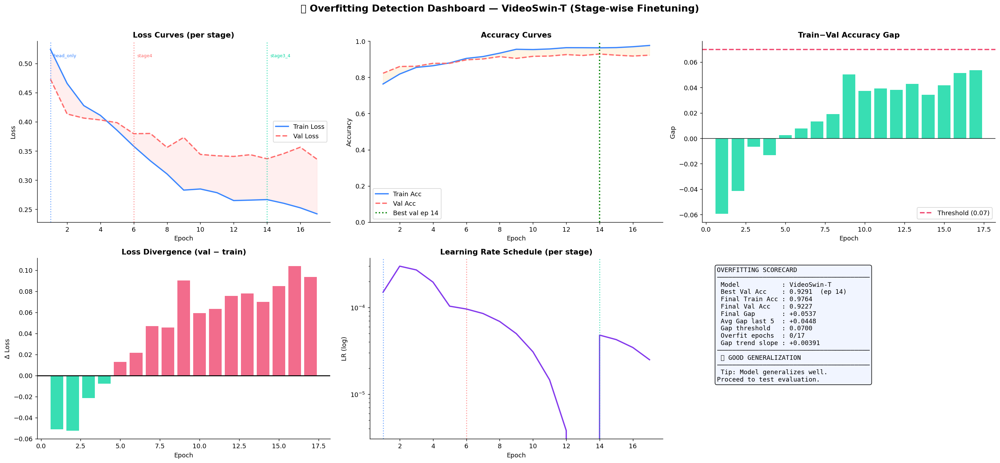

📊 Saved: overfitting_dashboard.png

══════════════════════════════════════════════════
  🟢 GOOD GENERALIZATION
  Avg gap (last 5 ep): +0.0448
══════════════════════════════════════════════════


In [22]:
# ════════════════════════════════════════════════════════════════════════
#  9.1 — Overfitting Analysis Dashboard  (stage-aware)
# ════════════════════════════════════════════════════════════════════════

ep          = range(1, len(history['train_loss']) + 1)
stages      = history['stage']
gap_vals    = history['acc_gap']
GAP_THRESH  = CFG['overfitting_gap']
STAGE_NAMES = [s['name'] for s in CFG['finetune_stages']]  # dynamic — no hardcoded /4
SCOLS       = ['#3A86FF', '#FF6B6B', '#06D6A0', '#FF9F1C']  # up to 4 stages

# Map epoch → stage color
def stage_color(ep_idx):
    s = stages[ep_idx] if ep_idx < len(stages) else STAGE_NAMES[-1]
    idx = STAGE_NAMES.index(s) if s in STAGE_NAMES else 0
    return SCOLS[idx]

ep_colors = [stage_color(i) for i in range(len(ep))]

fig, axes = plt.subplots(2, 3, figsize=(22, 10))
fig.suptitle('🔬 Overfitting Detection Dashboard — VideoSwin-T (Stage-wise Finetuning)',
             fontsize=15, fontweight='bold', y=1.01)

# ── Plot 1: Loss curves with stage bands ──────────────────────────────
ax = axes[0,0]
ax.plot(ep, history['train_loss'], color='#3A86FF', lw=2, label='Train Loss')
ax.plot(ep, history['val_loss'],   color='#FF6B6B', lw=2, linestyle='--', label='Val Loss')
ax.fill_between(ep, history['train_loss'], history['val_loss'], alpha=0.1, color='#FF6B6B')
# Stage boundaries
cum = 0
for i, s in enumerate(CFG['finetune_stages']):
    ax.axvline(cum + 1, color=SCOLS[i], lw=1.5, linestyle=':', alpha=0.7)
    ax.text(cum + 1.2, ax.get_ylim()[1] * 0.95 if ax.get_ylim()[1] else 1,
            s['name'], fontsize=7, color=SCOLS[i])
    cum += s['epochs']
ax.set_title('Loss Curves (per stage)', fontweight='bold')
ax.set_xlabel('Epoch'); ax.set_ylabel('Loss'); ax.legend()

# ── Plot 2: Accuracy curves ───────────────────────────────────────────
ax = axes[0,1]
ax.plot(ep, history['train_acc'], color='#3A86FF', lw=2, label='Train Acc')
ax.plot(ep, history['val_acc'],   color='#FF6B6B', lw=2, linestyle='--', label='Val Acc')
best_e = int(np.argmax(history['val_acc'])) + 1
ax.axvline(best_e, color='green', lw=2, linestyle=':', label=f'Best val ep {best_e}')
ax.fill_between(ep, history['val_acc'], history['train_acc'], alpha=0.1, color='orange')
ax.set_ylim(0, 1)
ax.set_title('Accuracy Curves', fontweight='bold')
ax.set_xlabel('Epoch'); ax.set_ylabel('Accuracy'); ax.legend()

# ── Plot 3: Accuracy gap bars ─────────────────────────────────────────
ax = axes[0,2]
bar_colors = ['#EF476F' if g > GAP_THRESH else '#06D6A0' for g in gap_vals]
ax.bar(ep, gap_vals, color=bar_colors, alpha=0.8, edgecolor='none')
ax.axhline(GAP_THRESH, color='#EF476F', lw=2, linestyle='--', label=f'Threshold ({GAP_THRESH})')
ax.axhline(0, color='black', lw=0.8)
ax.set_title('Train−Val Accuracy Gap', fontweight='bold')
ax.set_xlabel('Epoch'); ax.set_ylabel('Gap'); ax.legend()

# ── Plot 4: Loss divergence ───────────────────────────────────────────
ax = axes[1,0]
diverging = np.array(history['val_loss']) - np.array(history['train_loss'])
div_colors = ['#EF476F' if d > 0 else '#06D6A0' for d in diverging]
ax.bar(ep, diverging, color=div_colors, alpha=0.8, edgecolor='none')
ax.axhline(0, color='black', lw=1.5)
ax.set_title('Loss Divergence (val − train)', fontweight='bold')
ax.set_xlabel('Epoch'); ax.set_ylabel('Δ Loss')

# ── Plot 5: LR schedule with stage annotation ─────────────────────────
ax = axes[1,1]
ax.plot(ep, history['lr'], color='#8338EC', lw=2)
ax.set_yscale('log')
ax.set_title('Learning Rate Schedule (per stage)', fontweight='bold')
ax.set_xlabel('Epoch'); ax.set_ylabel('LR (log)')
cum = 0
for i, s in enumerate(CFG['finetune_stages']):
    ax.axvline(cum + 1, color=SCOLS[i], lw=1.5, linestyle=':', alpha=0.7)
    cum += s['epochs']

# ── Plot 6: Scorecard ─────────────────────────────────────────────────
ax = axes[1,2]; ax.axis('off')

final_gap     = gap_vals[-1] if gap_vals else 0
avg_gap_last5 = float(np.mean(gap_vals[-5:])) if len(gap_vals) >= 5 else float(np.mean(gap_vals))
best_val      = max(history['val_acc'])
n_overfit     = sum(1 for g in gap_vals if g > GAP_THRESH)
slope         = float(np.polyfit(range(min(5, len(gap_vals))), gap_vals[-5:], 1)[0]) if len(gap_vals) >= 2 else 0

if avg_gap_last5 > GAP_THRESH * 1.5:
    diag = '🔴 STRONG OVERFITTING'
    tip  = 'Stronger dropout, more augmentation,\nfreeze more layers or get more data.'
elif avg_gap_last5 > GAP_THRESH:
    diag = '🟡 MILD OVERFITTING'
    tip  = 'Try stronger augmentation\nor increase weight_decay.'
elif avg_gap_last5 < 0.01 and best_val < 0.70:
    diag = '🔵 UNDERFITTING'
    tip  = 'Unfreeze more layers or\ntrain longer with lower LR.'
else:
    diag = '🟢 GOOD GENERALIZATION'
    tip  = 'Model generalizes well.\nProceed to test evaluation.'

card = (
    f'OVERFITTING SCORECARD\n'
    f'{"─"*40}\n'
    f' Model           : VideoSwin-T\n'
    f' Best Val Acc    : {best_val:.4f}  (ep {best_e})\n'
    f' Final Train Acc : {history["train_acc"][-1]:.4f}\n'
    f' Final Val Acc   : {history["val_acc"][-1]:.4f}\n'
    f' Final Gap       : {final_gap:+.4f}\n'
    f' Avg Gap last 5  : {avg_gap_last5:+.4f}\n'
    f' Gap threshold   : {GAP_THRESH:.4f}\n'
    f' Overfit epochs  : {n_overfit}/{len(gap_vals)}\n'
    f' Gap trend slope : {slope:+.5f}\n'
    f'{"─"*40}\n'
    f' {diag}\n'
    f'{"─"*40}\n'
    f' Tip: {tip}'
)
ax.text(0.05, 0.95, card, transform=ax.transAxes, fontsize=10,
        verticalalignment='top', fontfamily='monospace',
        bbox=dict(boxstyle='round', facecolor='#F0F4FF', alpha=0.9))

plt.tight_layout()
plt.savefig('overfitting_dashboard.png', bbox_inches='tight')
plt.show()
print(f'📊 Saved: overfitting_dashboard.png')
print(f'\n{"═"*50}\n  {diag}\n  Avg gap (last 5 ep): {avg_gap_last5:+.4f}\n{"═"*50}')


<a id='10'></a>
## . 📊 Evaluation & Metrics


In [23]:
# ── Load best checkpoint for evaluation ─────────────────────────────────
# Always reload best weights here regardless of training/resume mode
_ckpt = torch.load(CFG['best_model_path'], map_location=DEVICE)
_weights = _ckpt.get('model_state_dict', _ckpt)
model.load_state_dict(_weights)
model.eval()
best_val_acc = _ckpt.get('best_val_acc', best_val_acc)
best_epoch   = _ckpt.get('best_epoch',   best_epoch)
if not history and 'finetune_history' in _ckpt:
    history = _ckpt['finetune_history']
print(f'Best model loaded: {CFG["best_model_path"]}')
print(f'  val_acc={best_val_acc:.4f}  epoch={best_epoch}')


Best model loaded: /kaggle/working/videoswin_t_best.pth
  val_acc=0.9291  epoch=14


In [24]:
# ════════════════════════════════════════════════════════════════════════
#  10.1 — Collect Val predictions
# ════════════════════════════════════════════════════════════════════════

def collect_predictions(model, loader, device):
    preds, labels_all, probs = [], [], []
    model.eval()
    with torch.no_grad():
        for frames, lbs in tqdm(loader, desc='Predicting'):
            frames = frames.to(device)
            with torch.amp.autocast('cuda'):
                out = model(frames)
            probs.extend(torch.softmax(out, dim=1)[:, 1].cpu().numpy())
            preds.extend(out.argmax(1).cpu().numpy())
            labels_all.extend(lbs.numpy())
    return np.array(labels_all), np.array(preds), np.array(probs)

val_labels, val_preds, val_probs = collect_predictions(model, val_loader, DEVICE)
print(f'Val samples: {len(val_labels)}')


Predicting:   0%|          | 0/78 [00:00<?, ?it/s]

Val samples: 621


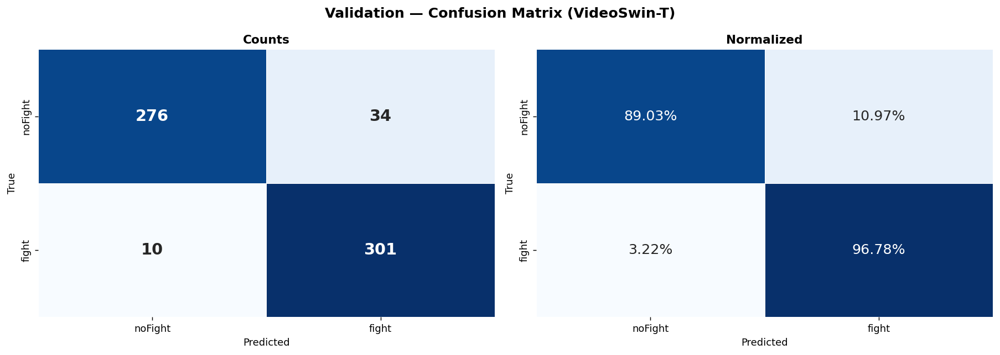


📋 Val Classification Report:
              precision    recall  f1-score   support

     noFight     0.9650    0.8903    0.9262       310
       fight     0.8985    0.9678    0.9319       311

    accuracy                         0.9291       621
   macro avg     0.9318    0.9291    0.9290       621
weighted avg     0.9317    0.9291    0.9290       621

  AUC-ROC     : 0.9711
  AUC-PR      : 0.9515
  Sensitivity : 0.9678
  Specificity : 0.8903


In [25]:
# ════════════════════════════════════════════════════════════════════════
#  10.2 — Confusion Matrix + Classification Report (Val)
# ════════════════════════════════════════════════════════════════════════

cm = confusion_matrix(val_labels, val_preds)
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Validation — Confusion Matrix (VideoSwin-T)', fontsize=14, fontweight='bold')

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=CFG['classes'], yticklabels=CFG['classes'],
            ax=axes[0], linewidths=.5, cbar=False,
            annot_kws={'size': 16, 'weight': 'bold'})
axes[0].set_title('Counts', fontweight='bold')
axes[0].set_xlabel('Predicted'); axes[0].set_ylabel('True')

cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)
sns.heatmap(cm_norm, annot=True, fmt='.2%', cmap='Blues',
            xticklabels=CFG['classes'], yticklabels=CFG['classes'],
            ax=axes[1], linewidths=.5, cbar=False, annot_kws={'size': 14})
axes[1].set_title('Normalized', fontweight='bold')
axes[1].set_xlabel('Predicted'); axes[1].set_ylabel('True')

plt.tight_layout()
plt.savefig('val_confusion_matrix.png', bbox_inches='tight')
plt.show()

tn, fp, fn, tp = cm.ravel()
auc_roc = roc_auc_score(val_labels, val_probs)
auc_pr  = average_precision_score(val_labels, val_probs)
print('\n📋 Val Classification Report:')
print(classification_report(val_labels, val_preds, target_names=CFG['classes'], digits=4))
print(f'  AUC-ROC     : {auc_roc:.4f}')
print(f'  AUC-PR      : {auc_pr:.4f}')
print(f'  Sensitivity : {tp/(tp+fn):.4f}')
print(f'  Specificity : {tn/(tn+fp):.4f}')


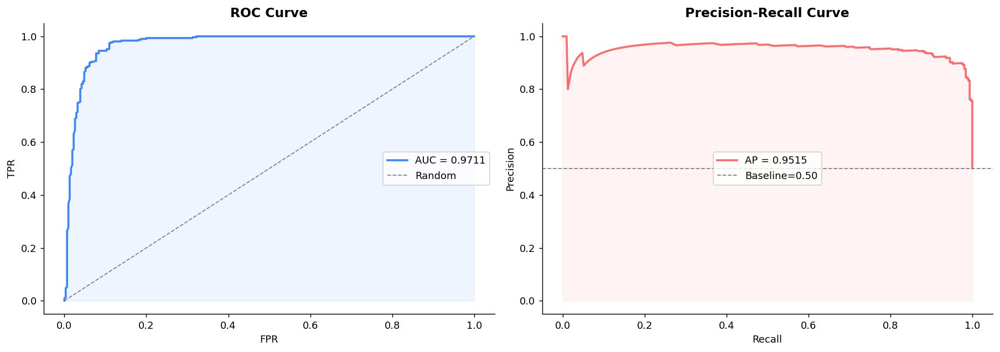

In [26]:
# ════════════════════════════════════════════════════════════════════════
#  10.3 — ROC & Precision-Recall Curves
# ════════════════════════════════════════════════════════════════════════

fpr, tpr, _ = roc_curve(val_labels, val_probs)
prec, rec, _ = precision_recall_curve(val_labels, val_probs)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(fpr, tpr, color='#3A86FF', lw=2, label=f'AUC = {auc_roc:.4f}')
axes[0].plot([0,1],[0,1], color='gray', lw=1, linestyle='--', label='Random')
axes[0].fill_between(fpr, tpr, alpha=0.08, color='#3A86FF')
axes[0].set_title('ROC Curve', fontweight='bold', fontsize=13)
axes[0].set_xlabel('FPR'); axes[0].set_ylabel('TPR'); axes[0].legend()

baseline = val_labels.mean()
axes[1].plot(rec, prec, color='#FF6B6B', lw=2, label=f'AP = {auc_pr:.4f}')
axes[1].axhline(baseline, color='gray', lw=1, linestyle='--', label=f'Baseline={baseline:.2f}')
axes[1].fill_between(rec, prec, alpha=0.08, color='#FF6B6B')
axes[1].set_title('Precision-Recall Curve', fontweight='bold', fontsize=13)
axes[1].set_xlabel('Recall'); axes[1].set_ylabel('Precision'); axes[1].legend()

plt.tight_layout()
plt.savefig('roc_pr_curves.png', bbox_inches='tight')
plt.show()


Predicting:   0%|          | 0/78 [00:00<?, ?it/s]


═══════════════════════════════════════════════════════
  🧪 FINAL TEST SET RESULTS (VideoSwin-T)
═══════════════════════════════════════════════════════
  Accuracy    : 0.9388
  AUC-ROC     : 0.9848
  AUC-PR      : 0.9835
  Sensitivity : 0.9774  (fight recall)
  Specificity : 0.9003  (noFight recall)
═══════════════════════════════════════════════════════

📊 Val vs Test:
   Val  Acc=0.9291  |  Test Acc=0.9388  | Δ=+0.0097
   ✅  Consistent — no leakage detected

📋 Test Classification Report:
              precision    recall  f1-score   support

     noFight     0.9756    0.9003    0.9365       311
       fight     0.9072    0.9774    0.9410       310

    accuracy                         0.9388       621
   macro avg     0.9414    0.9389    0.9387       621
weighted avg     0.9415    0.9388    0.9387       621



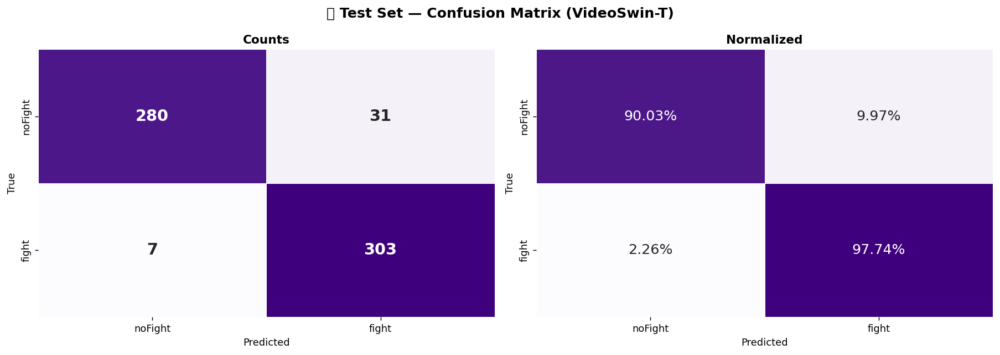

In [27]:
# ════════════════════════════════════════════════════════════════════════
#  10.4 — TEST SET EVALUATION (held-out — final score)
# ════════════════════════════════════════════════════════════════════════

test_labels, test_preds, test_probs = collect_predictions(model, test_loader, DEVICE)

cm_test         = confusion_matrix(test_labels, test_preds)
tn2,fp2,fn2,tp2 = cm_test.ravel()
test_acc        = (tp2 + tn2) / len(test_labels)
test_auc        = roc_auc_score(test_labels, test_probs)
test_ap         = average_precision_score(test_labels, test_probs)

print('\n' + '═'*55)
print('  🧪 FINAL TEST SET RESULTS (VideoSwin-T)')
print('═'*55)
print(f'  Accuracy    : {test_acc:.4f}')
print(f'  AUC-ROC     : {test_auc:.4f}')
print(f'  AUC-PR      : {test_ap:.4f}')
print(f'  Sensitivity : {tp2/(tp2+fn2):.4f}  (fight recall)')
print(f'  Specificity : {tn2/(tn2+fp2):.4f}  (noFight recall)')
print('═'*55)
print(f'\n📊 Val vs Test:')
print(f'   Val  Acc={best_val_acc:.4f}  |  Test Acc={test_acc:.4f}  | Δ={test_acc-best_val_acc:+.4f}')
leakage = abs(test_acc - best_val_acc) > 0.05
print('   ⚠️  Large gap — check for leakage' if leakage else '   ✅  Consistent — no leakage detected')

print('\n📋 Test Classification Report:')
print(classification_report(test_labels, test_preds, target_names=CFG['classes'], digits=4))

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('🧪 Test Set — Confusion Matrix (VideoSwin-T)', fontsize=14, fontweight='bold')
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Purples',
            xticklabels=CFG['classes'], yticklabels=CFG['classes'],
            ax=axes[0], linewidths=.5, cbar=False, annot_kws={'size': 16, 'weight': 'bold'})
axes[0].set_title('Counts', fontweight='bold'); axes[0].set_xlabel('Predicted'); axes[0].set_ylabel('True')
cm_n = cm_test.astype(float) / cm_test.sum(axis=1, keepdims=True)
sns.heatmap(cm_n, annot=True, fmt='.2%', cmap='Purples',
            xticklabels=CFG['classes'], yticklabels=CFG['classes'],
            ax=axes[1], linewidths=.5, cbar=False, annot_kws={'size': 14})
axes[1].set_title('Normalized', fontweight='bold'); axes[1].set_xlabel('Predicted'); axes[1].set_ylabel('True')
plt.tight_layout(); plt.savefig('test_confusion_matrix.png', bbox_inches='tight'); plt.show()


<a id='11'></a>
## 11. Explainable AI — Grad-CAM on VideoSwin-T

Grad-CAM applied to the **last Swin stage** (deepest 3D attention block).  
Since VideoSwin operates on volumetric (T×H×W) patches, we visualize the  
**middle frame** of each clip for spatial interpretability.  
🔴 Warm = high model attention &nbsp;|&nbsp; 🔵 Cool = low attention


In [28]:
import os
print(os.path.exists('/kaggle/working/videoswin_t_violence.pth'))
print(os.path.exists('/kaggle/working/val_df.csv'))

False
False


In [29]:
train_df.to_csv('/kaggle/working/train_df.csv', index=False)
val_df.to_csv('/kaggle/working/val_df.csv',     index=False)
test_df.to_csv('/kaggle/working/test_df.csv',   index=False)
print('CSV splits saved')

CSV splits saved


OK monkey-patch scale_cam_image appliqué
OK Grad-CAM initialisé


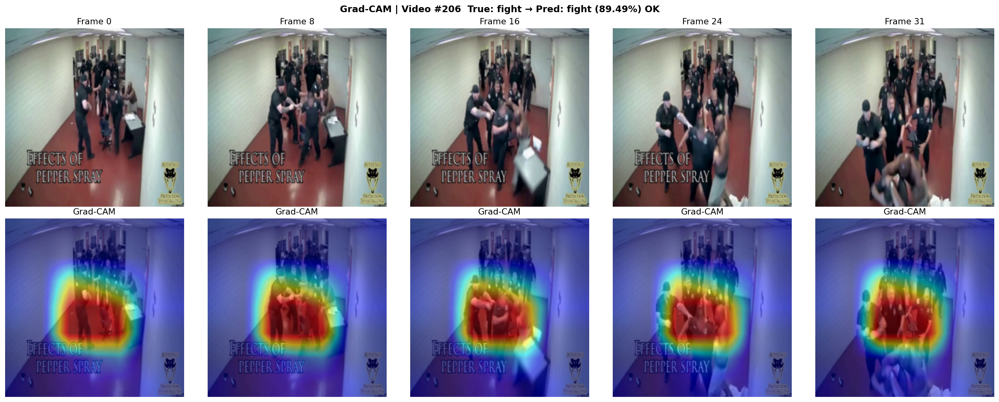

Video 206 | True=fight      Pred=fight      Conf=89.49% OK


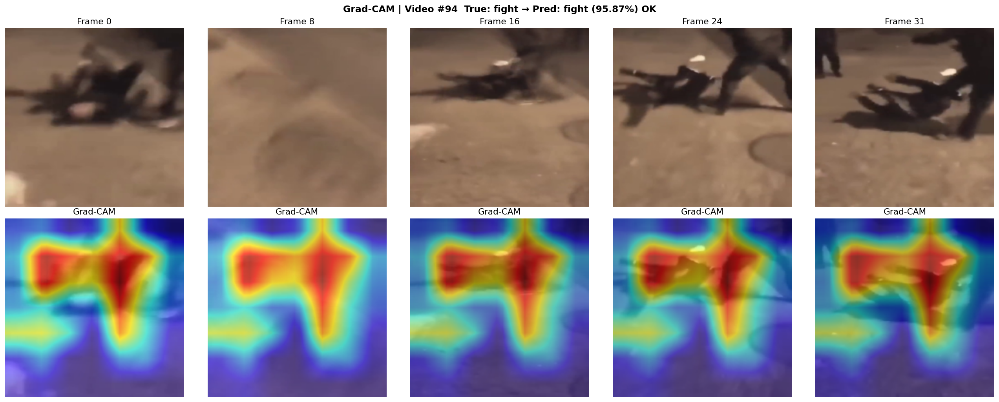

Video  94 | True=fight      Pred=fight      Conf=95.87% OK


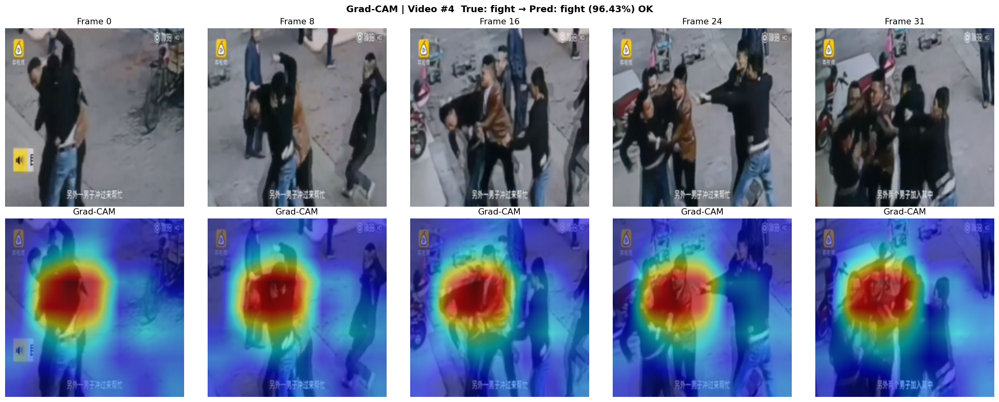

Video   4 | True=fight      Pred=fight      Conf=96.43% OK


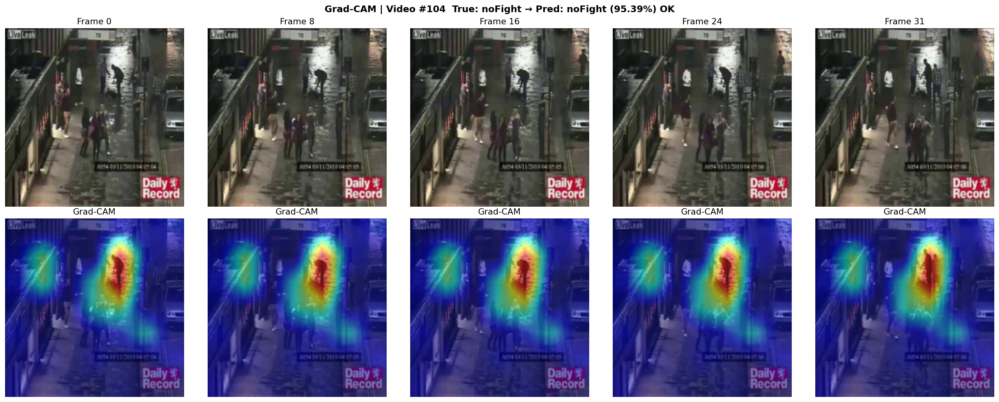

Video 104 | True=noFight    Pred=noFight    Conf=95.39% OK


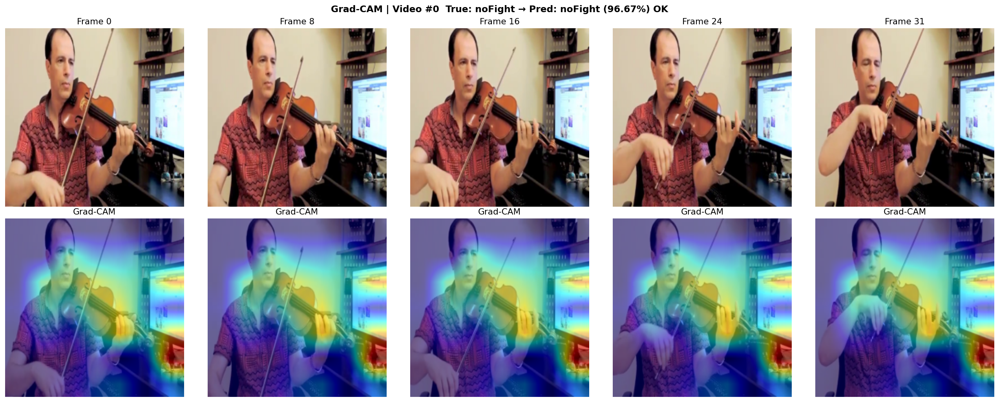

Video   0 | True=noFight    Pred=noFight    Conf=96.67% OK


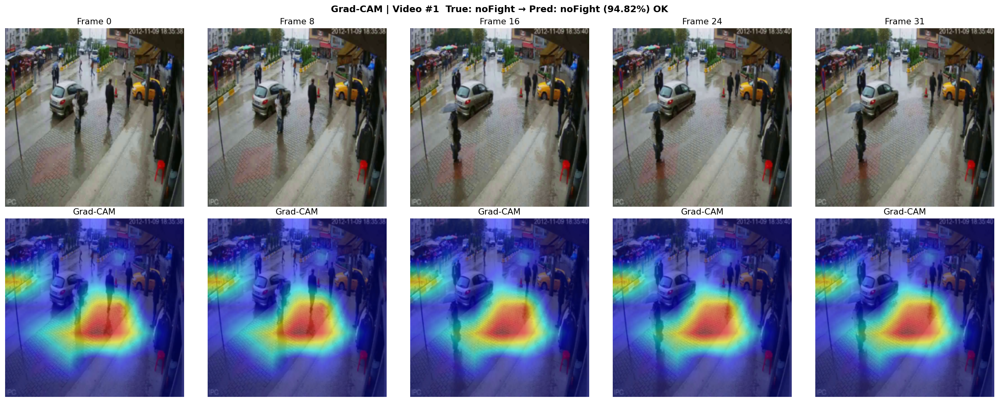

Video   1 | True=noFight    Pred=noFight    Conf=94.82% OK
OK 11.1 Grad-CAM overlays done


In [66]:
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
import random

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import pytorch_grad_cam.utils.image as pgc_image
import pytorch_grad_cam.base_cam as pgc_base


# ═════════════════════════════════════════════════════════════
# MONKEY PATCH (fix resize CAM)
# ═════════════════════════════════════════════════════════════

def _scale_cam_image_fixed(cam, target_size=None):
    result = []
    for img in cam:
        while img.ndim > 2:
            img = img.mean(axis=0)
        img = img - np.min(img)
        img = img / (1e-7 + np.max(img))
        if target_size is not None:
            if len(target_size) == 3:
                ts = (int(target_size[2]), int(target_size[1]))
            else:
                ts = (int(target_size[1]), int(target_size[0]))
            img = cv2.resize(np.float32(img), ts)
        result.append(img)
    return np.float32(result)

pgc_image.scale_cam_image = _scale_cam_image_fixed
pgc_base.scale_cam_image = _scale_cam_image_fixed

print("OK monkey-patch appliqué")


# ═════════════════════════════════════════════════════════════
H_FRAME, W_FRAME = 224, 224
FRAMES_TO_SHOW = [0, 8, 16, 24, 31]


# ═════════════════════════════════════════════════════════════
# reshape transform (Swin → CNN-like feature map)
# ═════════════════════════════════════════════════════════════

def reshape_transform(x):
    if x.ndim == 5:
        x = x.mean(dim=1)
        x = x.permute(0, 3, 1, 2)
    elif x.ndim == 4:
        x = x.permute(0, 3, 1, 2)
    elif x.ndim == 3:
        B, N, C = x.shape
        H = W = int(N ** 0.5)
        x = x.reshape(B, H, W, C).permute(0, 3, 1, 2)
    return x.contiguous()


# ═════════════════════════════════════════════════════════════
# Grad-CAM init
# ═════════════════════════════════════════════════════════════

target_layer = [model.backbone.features[-1][-1].norm2]

cam = GradCAM(
    model=model,
    target_layers=target_layer,
    reshape_transform=reshape_transform
)

print("OK Grad-CAM initialisé")


# ═════════════════════════════════════════════════════════════
# Utils
# ═════════════════════════════════════════════════════════════

def denormalize_kinetics(tensor):
    mean = torch.tensor([0.45, 0.45, 0.45]).view(3, 1, 1)
    std  = torch.tensor([0.225, 0.225, 0.225]).view(3, 1, 1)
    img = (tensor.cpu() * std + mean).permute(1, 2, 0).numpy()
    return np.clip(img, 0, 1).astype(np.float32)


def normalize_cam(cam_map):
    cam_map = np.array(cam_map, dtype=np.float32)
    while cam_map.ndim > 2:
        cam_map = cam_map.mean(axis=0)
    cam_map = cv2.resize(cam_map, (W_FRAME, H_FRAME))
    cam_map -= cam_map.min()
    cam_map /= cam_map.max() + 1e-8
    return cam_map


# ═════════════════════════════════════════════════════════════
# RANDOM SAMPLING (NEW PART)
# ═════════════════════════════════════════════════════════════

def get_random_indices(dataset, n=6):
    return random.sample(range(len(dataset)), n)


sample_indices = get_random_indices(val_ds, n=6)


# ═════════════════════════════════════════════════════════════
# Grad-CAM function
# ═════════════════════════════════════════════════════════════

def gradcam_video(video_idx, dataset, frames=FRAMES_TO_SHOW):

    sample = dataset[video_idx]
    clip, label = sample[0], sample[1]

    inp = clip.unsqueeze(0).to(DEVICE)

    model.eval()
    out = model(inp)
    pred = out.argmax(1).item()
    conf = torch.softmax(out, dim=1)[0, pred].item()

    label_int = label.item() if hasattr(label, "item") else int(label)
    true_name = CFG['classes'][label_int]
    pred_name = CFG['classes'][pred]
    ok_sym = "OK" if pred == label_int else "WRONG"

    raw_cam = cam(input_tensor=inp, targets=[ClassifierOutputTarget(pred)])[0]
    cam_map = normalize_cam(raw_cam)

    n = len(frames)
    fig, axes = plt.subplots(2, n, figsize=(4 * n, 8))

    fig.suptitle(
        f'Grad-CAM | Video #{video_idx}  '
        f'True: {true_name} → Pred: {pred_name} ({conf:.2%}) {ok_sym}',
        fontsize=13, fontweight='bold'
    )

    for col, fi in enumerate(frames):
        rgb = denormalize_kinetics(clip[:, fi, :, :])
        overlay = show_cam_on_image(rgb, cam_map, use_rgb=True)

        axes[0, col].imshow(rgb)
        axes[0, col].set_title(f'Frame {fi}')
        axes[0, col].axis('off')

        axes[1, col].imshow(overlay)
        axes[1, col].set_title('Grad-CAM')
        axes[1, col].axis('off')

    plt.tight_layout()
    return fig, pred_name, true_name, conf, ok_sym


# ═════════════════════════════════════════════════════════════
# RUN RANDOM VISUALIZATION
# ═════════════════════════════════════════════════════════════

for idx in sample_indices:
    try:
        fig, pred_name, true_name, conf, ok = gradcam_video(idx, val_ds)
        fig.savefig(f'gradcam_video_{idx}.png', bbox_inches='tight')
        plt.show()

        print(f'Video {idx:3d} | True={true_name:10s} '
              f'Pred={pred_name:10s} Conf={conf:.2%} {ok}')

    except Exception as e:
        import traceback
        print(f'WARNING Video {idx} skipped: {e}')
        traceback.print_exc()
        plt.close('all')

print("OK Grad-CAM random videos done")

In [1]:
# ══════════════════════════════════════════════════════════════
# XAI — Frame Importance Temporelle (Video Swin)
# ══════════════════════════════════════════════════════════════
import torch, numpy as np, matplotlib.pyplot as plt, random

def frame_importance(video_idx, dataset):
    """
    Mesure l'importance de chaque frame en masquant une frame à la fois
    et en mesurant la chute de confiance sur la classe prédite.
    """
    sample      = dataset[video_idx]
    clip, label = sample[0], sample[1]
    inp         = clip.unsqueeze(0).to(DEVICE)
    T           = clip.shape[1]   # nombre de frames

    model.eval()
    with torch.no_grad():
        base_out  = model(inp)
        pred      = base_out.argmax(1).item()
        base_conf = torch.softmax(base_out, dim=1)[0, pred].item()

    label_int = label.item() if hasattr(label, 'item') else int(label)
    true_name = CFG['classes'][label_int]
    pred_name = CFG['classes'][pred]
    ok_sym    = 'OK' if pred == label_int else 'WRONG'

    # Masquer chaque frame → mesurer chute de confiance
    scores = []
    with torch.no_grad():
        for fi in range(T):
            masked       = inp.clone()
            masked[0, :, fi, :, :] = 0.0   # frame fi → noir
            out_masked   = model(masked)
            conf_masked  = torch.softmax(out_masked, dim=1)[0, pred].item()
            scores.append(base_conf - conf_masked)   # chute = importance

    scores = np.array(scores)
    scores = np.clip(scores, 0, None)   # garder seulement les chutes positives

    fig, ax = plt.subplots(figsize=(12, 4))
    colors  = ['#EF476F' if s > np.percentile(scores, 75) else '#06D6A0' for s in scores]
    ax.bar(range(T), scores, color=colors, edgecolor='white')
    ax.set_xlabel('Frame index')
    ax.set_ylabel('Confidence drop (importance)')
    ax.set_title(
        f'Frame Importance | Video #{video_idx}  '
        f'True: {true_name} → Pred: {pred_name} ({base_conf:.2%}) {ok_sym}',
        fontweight='bold'
    )
    ax.axhline(np.mean(scores), color='gray', linestyle='--', label='mean')
    ax.legend()
    plt.tight_layout()
    return fig, scores, pred_name, true_name, base_conf, ok_sym

# ── Run sur vidéos aléatoires ──
all_fight   = [i for i in range(len(val_ds)) if get_label_str(val_ds, i) == 'fight']
all_nofight = [i for i in range(len(val_ds)) if get_label_str(val_ds, i) == 'noFight']
fi_idx = random.sample(all_fight,   min(2, len(all_fight)))
nf_idx = random.sample(all_nofight, min(2, len(all_nofight)))

for idx in fi_idx + nf_idx:
    try:
        fig, scores, pred_name, true_name, conf, ok = frame_importance(idx, val_ds)
        fig.savefig(f'frame_importance_{idx}.png', bbox_inches='tight')
        plt.show()
        top3 = np.argsort(scores)[::-1][:3]
        print(f'Video {idx:3d} | True={true_name} Pred={pred_name} Conf={conf:.2%} {ok} | Top frames: {top3.tolist()}')
    except Exception as e:
        import traceback; traceback.print_exc()
        plt.close('all')

print('OK Frame Importance done')

NameError: name 'val_ds' is not defined

<a id='12'></a>
## 12. Save Model


In [33]:
# ════════════════════════════════════════════════════════════════════════
#  SAVE FULL CHECKPOINT WITH METADATA
#  Uses versioned filename to avoid overwriting previous runs
# ════════════════════════════════════════════════════════════════════════

try:
    import time as _t
    _ts       = _t.strftime('%Y%m%d_%H%M')
    _save_path = f'/kaggle/working/videoswin_t_{_ts}.pth'

    _test_acc = float(test_acc)  if 'test_acc'  in vars() else float('nan')
    _test_auc = float(test_auc)  if 'test_auc'  in vars() else float('nan')
    _test_ap  = float(test_ap)   if 'test_ap'   in vars() else float('nan')

    save_dict = {
        'model_state_dict' : model.state_dict(),
        'model_class'      : 'VideoSwinViolence',
        'architecture'     : 'VideoSwin-T (swin3d_t) -- Kinetics-400 pretrained',
        'num_frames'       : CFG['num_frames'],
        'frame_stride'     : CFG['frame_stride'],
        'img_size'         : CFG['img_size'],
        'classes'          : CFG['classes'],
        'best_val_acc'     : best_val_acc,
        'best_epoch'       : best_epoch,
        'test_acc'         : _test_acc,
        'auc_roc'          : _test_auc,
        'auc_pr'           : _test_ap,
        'cfg'              : CFG,
        'finetune_history' : history,
    }

    import torch as _torch
    _torch.save(save_dict, _save_path)
    # Also update the canonical best path
    _torch.save(save_dict, CFG['best_model_path'])

    print('=' * 60)
    print(f'  Versioned : {_save_path}')
    print(f'  Canonical : {CFG["best_model_path"]}')
    print(f'  Val Acc   : {best_val_acc:.4f}  (epoch {best_epoch})')
    print(f'  Test Acc  : {_test_acc:.4f}')
    print(f'  AUC-ROC   : {_test_auc:.4f}')
    print(f'  AUC-PR    : {_test_ap:.4f}')
    print('=' * 60)
    print('Reload snippet:')
    print(f'  ckpt  = torch.load("{_save_path}")')
    print( '  model = VideoSwinViolence(ckpt["cfg"])')
    print( '  model.load_state_dict(ckpt["model_state_dict"])')

except Exception as _e:
    print(f'WARNING Save FAILED: {_e}')


  Versioned : /kaggle/working/videoswin_t_20260505_2237.pth
  Canonical : /kaggle/working/videoswin_t_best.pth
  Val Acc   : 0.9291  (epoch 14)
  Test Acc  : 0.9388
  AUC-ROC   : 0.9848
  AUC-PR    : 0.9835
Reload snippet:
  ckpt  = torch.load("/kaggle/working/videoswin_t_20260505_2237.pth")
  model = VideoSwinViolence(ckpt["cfg"])
  model.load_state_dict(ckpt["model_state_dict"])
